In [2]:
import warnings
import pandas as pd
import numpy as np

from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as go

import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',1000)
warnings.filterwarnings("ignore")

init_notebook_mode(connected=True)

# 1. Análisis exploratorio

In [3]:
# Cargamos el dataset descargado de Kaggle como pandas dataframe
df = pd.read_csv('male_players.csv').reset_index(drop=True)
# Mostramos las primeras filas del dataframe
df.head(10)

,Unnamed: 0.1,Unnamed: 0,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,Sprint Speed,Positioning,Finishing,Shot Power,Long Shots,Volleys,Penalties,Vision,Crossing,Free Kick Accuracy,Short Passing,Long Passing,Curve,Dribbling,Agility,Balance,Reactions,Ball Control,Composure,Interceptions,Heading Accuracy,Def Awareness,Standing Tackle,Sliding Tackle,Jumping,Stamina,Strength,Aggression,Position,Weak foot,Skill moves,Preferred foot,Height,Weight,Alternative positions,Age,Nation,League,Team,play style,url,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes
0,0,0,1,Kylian Mbappé,91,97,90,80,92,36,78,97,97,93,94,90,83,84,84,83,78,69,86,71,80,93,93,82,93,92,88,38,73,26,34,32,88,88,77,64,ST,4,5,Right,"182cm / 6'0""",75kg / 165lb,LW,25,France,LALIGA EA SPORTS,Real Madrid,"Quick Step+, Acrobatic, Finesse Shot, Flair, R...",https://www.ea.com/games/ea-sports-fc/ratings/...,NaN,NaN,NaN,NaN,NaN
1,1,1,2,Rodri,91,66,80,86,84,87,85,65,66,76,74,92,89,71,62,84,76,64,93,91,86,84,66,67,93,90,94,84,81,92,87,82,83,91,83,85,CDM,4,3,Right,"191cm / 6'3""",82kg / 181lb,CM,28,Spain,Premier League,Manchester City,"Tiki Taka+, Aerial, Bruiser, Long Ball Pass, P...",https://www.ea.com/games/ea-sports-fc/ratings/...,NaN,NaN,NaN,NaN,NaN
2,2,2,4,Erling Haaland,91,88,92,70,81,45,88,80,94,96,96,94,83,90,90,74,58,62,77,66,77,79,77,69,94,83,87,43,83,38,47,29,92,76,93,88,ST,3,3,Left,"195cm / 6'5""",94kg / 207lb,NaN,24,Norway,Premier League,Manchester City,"Acrobatic+, Bruiser, Power Header, Power Shot,...",https://www.ea.com/games/ea-sports-fc/ratings/...,NaN,NaN,NaN,NaN,NaN
3,3,3,5,Jude Bellingham,90,80,87,83,88,78,83,81,80,91,90,85,86,77,74,90,66,68,89,89,73,89,82,79,91,89,87,82,75,77,79,77,84,93,77,85,CAM,4,4,Right,"186cm / 6'1""",75kg / 165lb,CM,21,England,LALIGA EA SPORTS,Real Madrid,"Relentless+, Flair, Intercept, Slide Tackle, T...",https://www.ea.com/games/ea-sports-fc/ratings/...,NaN,NaN,NaN,NaN,NaN
4,4,4,7,Vini Jr.,90,95,84,81,91,29,69,95,95,87,89,81,83,73,71,85,81,62,83,77,79,93,94,84,86,90,83,26,50,32,25,18,74,84,65,58,LW,4,5,Right,"176cm / 5'9""",73kg / 161lb,"ST, LM",24,Brazil,LALIGA EA SPORTS,Real Madrid,"Quick Step+, Chip Shot, Finesse Shot, First To...",https://www.ea.com/games/ea-sports-fc/ratings/...,NaN,NaN,NaN,NaN,NaN
5,5,5,9,Kevin De Bruyne,90,67,87,94,87,65,78,67,67,88,84,92,90,83,83,95,95,83,94,93,93,86,75,78,92,92,88,66,55,66,70,53,71,88,75,75,CM,5,4,Right,"181cm / 5'11""",75kg / 165lb,CAM,33,Belgium,Premier League,Manchester City,"Incisive Pass+, Dead Ball, Long Ball Pass, Pin...",https://www.ea.com/games/ea-sports-fc/ratings/...,NaN,NaN,NaN,NaN,NaN
6,6,6,11,Harry Kane,90,65,93,84,83,49,82,64,66,94,95,94,89,89,93,86,80,69,86,88,82,82,66,73,94,87,92,42,91,46,46,38,87,75,86,80,ST,4,3,Right,"188cm / 6'2""",86kg / 190lb,NaN,31,England,Bundesliga,FC Bayern München,"Finesse Shot+, First Touch, Incisive Pass, Lon...",https://www.ea.com/games/ea-sports-fc/ratings/...,NaN,NaN,NaN,NaN,NaN
7,7,7,12,Martin Ødegaard,89,70,82,89,89,67,66,72,69,84,83,82,84,79,68,91,86,85,91,89,84,89,85,83,91,91,87,69,55,68,72,57,66,88,56,64,CM,2,5,Left,"178cm / 5'10""",68kg / 150lb,CAM,25,Norway,Premier League,Arsenal,"Incisive Pass+, First Touch, Flair, Pinged Pas...",https://www.ea.com/games/ea-sports-fc/ratings/...,NaN,NaN,NaN,NaN,NaN
8,8,8,13,Gianluigi Donnarumma,89,90,84,73,90,52,87,50,55,14,12,55,18,8,24,60,12,14,36,34,12,28,57,38,84,30,65,26,12,21,14,16,73,41,75,30,GK,3,1,Right,"196cm / 6'5""",90kg / 198lb,NaN,25,Italy,Ligue 1 McDonald's,Paris SG,"Deflector+, Footwork",https://www.ea.com/games/ea-sports-fc/ratings/...,90.0,84.0,73.0,87.0,90.0
9,9,9,15,Alisson,89,86,85,85,89,56,90,60,49,13,13,64,14,20,23,66,17,18,60,58,19,27,40,37,87,42,66,11,29,15,19,16,82,32,78,27,GK,3,1,Right,"193cm / 6'4""",91kg / 201lb,NaN,31,Brazil,Premier League,Liverpool,"Deflector+, 1v1 Close Down, Far Throw",https://www.ea.com/games/ea-sports-fc/ratings/...,86.0,85.0,85.0,90.0,89.0


In [4]:
df = df.drop(columns=['Unnamed: 0', 'Unnamed: 0.1', "url"]).reset_index(drop=True)
df.head(10)

,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,Sprint Speed,Positioning,Finishing,Shot Power,Long Shots,Volleys,Penalties,Vision,Crossing,Free Kick Accuracy,Short Passing,Long Passing,Curve,Dribbling,Agility,Balance,Reactions,Ball Control,Composure,Interceptions,Heading Accuracy,Def Awareness,Standing Tackle,Sliding Tackle,Jumping,Stamina,Strength,Aggression,Position,Weak foot,Skill moves,Preferred foot,Height,Weight,Alternative positions,Age,Nation,League,Team,play style,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes
0,1,Kylian Mbappé,91,97,90,80,92,36,78,97,97,93,94,90,83,84,84,83,78,69,86,71,80,93,93,82,93,92,88,38,73,26,34,32,88,88,77,64,ST,4,5,Right,"182cm / 6'0""",75kg / 165lb,LW,25,France,LALIGA EA SPORTS,Real Madrid,"Quick Step+, Acrobatic, Finesse Shot, Flair, R...",NaN,NaN,NaN,NaN,NaN
1,2,Rodri,91,66,80,86,84,87,85,65,66,76,74,92,89,71,62,84,76,64,93,91,86,84,66,67,93,90,94,84,81,92,87,82,83,91,83,85,CDM,4,3,Right,"191cm / 6'3""",82kg / 181lb,CM,28,Spain,Premier League,Manchester City,"Tiki Taka+, Aerial, Bruiser, Long Ball Pass, P...",NaN,NaN,NaN,NaN,NaN
2,4,Erling Haaland,91,88,92,70,81,45,88,80,94,96,96,94,83,90,90,74,58,62,77,66,77,79,77,69,94,83,87,43,83,38,47,29,92,76,93,88,ST,3,3,Left,"195cm / 6'5""",94kg / 207lb,NaN,24,Norway,Premier League,Manchester City,"Acrobatic+, Bruiser, Power Header, Power Shot,...",NaN,NaN,NaN,NaN,NaN
3,5,Jude Bellingham,90,80,87,83,88,78,83,81,80,91,90,85,86,77,74,90,66,68,89,89,73,89,82,79,91,89,87,82,75,77,79,77,84,93,77,85,CAM,4,4,Right,"186cm / 6'1""",75kg / 165lb,CM,21,England,LALIGA EA SPORTS,Real Madrid,"Relentless+, Flair, Intercept, Slide Tackle, T...",NaN,NaN,NaN,NaN,NaN
4,7,Vini Jr.,90,95,84,81,91,29,69,95,95,87,89,81,83,73,71,85,81,62,83,77,79,93,94,84,86,90,83,26,50,32,25,18,74,84,65,58,LW,4,5,Right,"176cm / 5'9""",73kg / 161lb,"ST, LM",24,Brazil,LALIGA EA SPORTS,Real Madrid,"Quick Step+, Chip Shot, Finesse Shot, First To...",NaN,NaN,NaN,NaN,NaN
5,9,Kevin De Bruyne,90,67,87,94,87,65,78,67,67,88,84,92,90,83,83,95,95,83,94,93,93,86,75,78,92,92,88,66,55,66,70,53,71,88,75,75,CM,5,4,Right,"181cm / 5'11""",75kg / 165lb,CAM,33,Belgium,Premier League,Manchester City,"Incisive Pass+, Dead Ball, Long Ball Pass, Pin...",NaN,NaN,NaN,NaN,NaN
6,11,Harry Kane,90,65,93,84,83,49,82,64,66,94,95,94,89,89,93,86,80,69,86,88,82,82,66,73,94,87,92,42,91,46,46,38,87,75,86,80,ST,4,3,Right,"188cm / 6'2""",86kg / 190lb,NaN,31,England,Bundesliga,FC Bayern München,"Finesse Shot+, First Touch, Incisive Pass, Lon...",NaN,NaN,NaN,NaN,NaN
7,12,Martin Ødegaard,89,70,82,89,89,67,66,72,69,84,83,82,84,79,68,91,86,85,91,89,84,89,85,83,91,91,87,69,55,68,72,57,66,88,56,64,CM,2,5,Left,"178cm / 5'10""",68kg / 150lb,CAM,25,Norway,Premier League,Arsenal,"Incisive Pass+, First Touch, Flair, Pinged Pas...",NaN,NaN,NaN,NaN,NaN
8,13,Gianluigi Donnarumma,89,90,84,73,90,52,87,50,55,14,12,55,18,8,24,60,12,14,36,34,12,28,57,38,84,30,65,26,12,21,14,16,73,41,75,30,GK,3,1,Right,"196cm / 6'5""",90kg / 198lb,NaN,25,Italy,Ligue 1 McDonald's,Paris SG,"Deflector+, Footwork",90.0,84.0,73.0,87.0,90.0
9,15,Alisson,89,86,85,85,89,56,90,60,49,13,13,64,14,20,23,66,17,18,60,58,19,27,40,37,87,42,66,11,29,15,19,16,82,32,78,27,GK,3,1,Right,"193cm / 6'4""",91kg / 201lb,NaN,31,Brazil,Premier League,Liverpool,"Deflector+, 1v1 Close Down, Far Throw",86.0,85.0,85.0,90.0,89.0


## Ficha de jugador

El dataset proviene de [EA SPORTS](https://www.ea.com/games/ea-sports-fc/ratings) (obtenido mediente webscapping). Cada fila tiene la información que contiene una ficha como la siguiente:

![Ficha de jugador](ficha.png)

Las columnas del dataset están detalladas en inglés en la página de Kaggle (copio aquí por comodidad):

### General
- Rank: Player’s ranking based on overall rating (OVR) within the FC 25 group.
- Name: The full name of the player.
- Height: The player’s height
- Weight: The player’s weight
- Position: The primary position the player plays on the field
- Alternative positions: Other positions the player is capable of playing effectively.
- Age: The player’s age.
- Nation: The country the player represents in international competitions.
- League: The football league in which the player currently plays.
- Team: The club team the player is part of.
- Play style: Specific gameplay traits or tendencies that define the player’s behavior and skillset on the field (e.g., "Quick Step", "Finesse Shot").
- URL: A link to the player's detailed profile.

### Player Attributes
- Acceleration: The player’s ability to reach maximum speed quickly.
- Sprint Speed: The top speed the player can achieve when sprinting.
- Positioning: The player's awareness and positioning in attack.
- Finishing: The player’s ability to convert scoring chances into goals.
- Shot Power: The strength of the player’s shots on goal.
- Long Shots: The accuracy and power of shots taken from outside the penalty area.
- Volleys: The player’s ability to strike the ball cleanly from mid-air.
- Penalties: The player's skill at taking penalty kicks.

## Passing and Vision
- Vision: The player's ability to make accurate passes and see plays develop.
- Crossing: The ability to deliver accurate crosses from wide areas.
- Free Kick Accuracy: The player’s precision when taking free kicks.
- Short Passing: The accuracy and skill in making short-distance passes.
- Long Passing: The ability to deliver accurate long-range passes.
- Curve: The player’s ability to bend the ball during passes or shots.

## Dribbling and Agility
- Dribbling: The player’s ball control and ability to maneuver in tight spaces.
- Agility: How quickly and smoothly the player can change direction.
- Balance: The player’s stability and ability to stay on their feet under pressure.
- Reactions: The player’s responsiveness to unpredictable events during the game.
- Ball Control: How well the player controls the ball while moving.

## Mentality and Defense
- Composure: The player’s calmness under pressure.
- Interceptions: The player’s ability to read and intercept passes.
- Heading Accuracy: The player's precision when attempting to head the ball.
- Defensive Awareness (Def Awareness): The player’s positioning and ability to anticipate defensive situations.
- Standing Tackle: The player’s ability to win the ball with a standing tackle.
- Sliding Tackle: The skill and accuracy of the player’s sliding tackles.

## Physical Attributes
- Jumping: The player’s ability to jump high during headers or challenges.
- Stamina: The player’s endurance and ability to perform at a high level throughout the match.
- Strength: The player’s physical power and ability to win physical challenges.
- Aggression: The player’s determination and intensity in winning challenges and duels.

## Technical Skills
- Weak foot: The player’s proficiency with their non-dominant foot (rated from 1 to 5 stars).
- Skill moves: The player’s ability to perform advanced dribbling moves (rated from 1 to 5 stars).
- Preferred foot: Indicates whether the player prefers using their left or right foot.

## Goalkeeping Attributes (if applicable)
- GK Diving: The goalkeeper’s ability to dive and make saves.
- GK Handling: The goalkeeper’s skill in catching or holding onto the ball.
- GK Kicking: The accuracy and power of the goalkeeper’s kicks when distributing the ball.
- GK Positioning: The goalkeeper’s ability to position themselves effectively during defensive situations.
- GK Reflexes: The goalkeeper’s quickness in reacting to shots.

In [61]:
# Por facilidad, hacemos una función que nos permite saber el significad de cada columna

def descripcion_columna(col):
    descripciones = {
        'Rank': "Player’s ranking based on overall rating (OVR) within the FC 25 group.",
        'Name': "The full name of the player.",
        'Height': "The player’s height.",
        'Weight': "The player’s weight.",
        'Position': "The primary position the player plays on the field.",
        'Alternative positions': "Other positions the player is capable of playing effectively.",
        'Age': "The player’s age.",
        'Nation': "The country the player represents in international competitions.",
        'League': "The football league in which the player currently plays.",
        'Team': "The club team the player is part of.",
        'play style': "Specific gameplay traits or tendencies that define the player’s behavior and skillset on the field (e.g., 'Quick Step', 'Finesse Shot').",
        'url': "A link to the player's detailed profile.",
        'OVR': "Overall rating of the player.",
        'PAC': "Pace: A summary attribute for speed-related skills.",
        'SHO': "Shooting: A summary attribute for shooting-related skills.",
        'PAS': "Passing: A summary attribute for passing-related skills.",
        'DRI': "Dribbling: A summary attribute for dribbling-related skills.",
        'DEF': "Defense: A summary attribute for defensive skills.",
        'PHY': "Physical: A summary attribute for physical skills.",
        'Acceleration': "The player’s ability to reach maximum speed quickly.",
        'Sprint Speed': "The top speed the player can achieve when sprinting.",
        'Positioning': "The player's awareness and positioning in attack.",
        'Finishing': "The player’s ability to convert scoring chances into goals.",
        'Shot Power': "The strength of the player’s shots on goal.",
        'Long Shots': "The accuracy and power of shots taken from outside the penalty area.",
        'Volleys': "The player’s ability to strike the ball cleanly from mid-air.",
        'Penalties': "The player's skill at taking penalty kicks.",
        'Vision': "The player's ability to make accurate passes and see plays develop.",
        'Crossing': "The ability to deliver accurate crosses from wide areas.",
        'Free Kick Accuracy': "The player’s precision when taking free kicks.",
        'Short Passing': "The accuracy and skill in making short-distance passes.",
        'Long Passing': "The ability to deliver accurate long-range passes.",
        'Curve': "The player’s ability to bend the ball during passes or shots.",
        'Dribbling': "The player’s ball control and ability to maneuver in tight spaces.",
        'Agility': "How quickly and smoothly the player can change direction.",
        'Balance': "The player’s stability and ability to stay on their feet under pressure.",
        'Reactions': "The player’s responsiveness to unpredictable events during the game.",
        'Ball Control': "How well the player controls the ball while moving.",
        'Composure': "The player’s calmness under pressure.",
        'Interceptions': "The player’s ability to read and intercept passes.",
        'Heading Accuracy': "The player's precision when attempting to head the ball.",
        'Def Awareness': "The player’s positioning and ability to anticipate defensive situations.",
        'Standing Tackle': "The player’s ability to win the ball with a standing tackle.",
        'Sliding Tackle': "The skill and accuracy of the player’s sliding tackles.",
        'Jumping': "The player’s ability to jump high during headers or challenges.",
        'Stamina': "The player’s endurance and ability to perform at a high level throughout the match.",
        'Strength': "The player’s physical power and ability to win physical challenges.",
        'Aggression': "The player’s determination and intensity in winning challenges and duels.",
        'Weak foot': "The player’s proficiency with their non-dominant foot (rated from 1 to 5 stars).",
        'Skill moves': "The player’s ability to perform advanced dribbling moves (rated from 1 to 5 stars).",
        'Preferred foot': "Indicates whether the player prefers using their left or right foot.",
        'GK Diving': "The goalkeeper’s ability to dive and make saves.",
        'GK Handling': "The goalkeeper’s skill in catching or holding onto the ball.",
        'GK Kicking': "The accuracy and power of the goalkeeper’s kicks when distributing the ball.",
        'GK Positioning': "The goalkeeper’s ability to position themselves effectively during defensive situations.",
        'GK Reflexes': "The goalkeeper’s quickness in reacting to shots."
    }
    return descripciones.get(col, "Descripción no disponible para esta columna.")

def tipo_posicion(pos):
    defenders = {"CB", "LB", "RB"}
    midfielders = {"CDM", "CM", "CAM", "LM", "RM"}
    forwards = {"LW", "RW", "ST"}

    if pos in defenders:
        return "Defender"
    elif pos in midfielders:
        return "Midfielder"
    elif pos in forwards:
        return "Forward"
    else:
        return "Unknown"
    
skills_groups = {
    "PAC": ["Acceleration", "Sprint Speed"],
    "SHO": ["Positioning", "Finishing", "Shot Power", "Long Shots", "Volleys", "Penalties"],
    "PAS": ["Vision", "Crossing", "Free Kick Accuracy", "Short Passing", "Long Passing", "Curve"],
    "DRI": ["Dribbling", "Agility", "Balance", "Reactions", "Ball Control", "Composure"],
    "DEF": ["Interceptions", "Heading Accuracy", "Def Awareness", "Standing Tackle", "Sliding Tackle"],
    "PHY": ["Jumping", "Stamina", "Strength", "Aggression"]
}
    
def get_skills_columns():
    return [col for cols in skills_groups.values() for col in cols]

def get_skills_summary():
    return list(skills_groups.keys())

In [6]:
descripcion_columna("OVR")

'Overall rating of the player.'

In [7]:
df["Type position"] = df["Position"].apply(tipo_posicion)
df.head(10)

,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,Sprint Speed,Positioning,Finishing,Shot Power,Long Shots,Volleys,Penalties,Vision,Crossing,Free Kick Accuracy,Short Passing,Long Passing,Curve,Dribbling,Agility,Balance,Reactions,Ball Control,Composure,Interceptions,Heading Accuracy,Def Awareness,Standing Tackle,Sliding Tackle,Jumping,Stamina,Strength,Aggression,Position,Weak foot,Skill moves,Preferred foot,Height,Weight,Alternative positions,Age,Nation,League,Team,play style,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Type position
0,1,Kylian Mbappé,91,97,90,80,92,36,78,97,97,93,94,90,83,84,84,83,78,69,86,71,80,93,93,82,93,92,88,38,73,26,34,32,88,88,77,64,ST,4,5,Right,"182cm / 6'0""",75kg / 165lb,LW,25,France,LALIGA EA SPORTS,Real Madrid,"Quick Step+, Acrobatic, Finesse Shot, Flair, R...",NaN,NaN,NaN,NaN,NaN,Forward
1,2,Rodri,91,66,80,86,84,87,85,65,66,76,74,92,89,71,62,84,76,64,93,91,86,84,66,67,93,90,94,84,81,92,87,82,83,91,83,85,CDM,4,3,Right,"191cm / 6'3""",82kg / 181lb,CM,28,Spain,Premier League,Manchester City,"Tiki Taka+, Aerial, Bruiser, Long Ball Pass, P...",NaN,NaN,NaN,NaN,NaN,Midfielder
2,4,Erling Haaland,91,88,92,70,81,45,88,80,94,96,96,94,83,90,90,74,58,62,77,66,77,79,77,69,94,83,87,43,83,38,47,29,92,76,93,88,ST,3,3,Left,"195cm / 6'5""",94kg / 207lb,NaN,24,Norway,Premier League,Manchester City,"Acrobatic+, Bruiser, Power Header, Power Shot,...",NaN,NaN,NaN,NaN,NaN,Forward
3,5,Jude Bellingham,90,80,87,83,88,78,83,81,80,91,90,85,86,77,74,90,66,68,89,89,73,89,82,79,91,89,87,82,75,77,79,77,84,93,77,85,CAM,4,4,Right,"186cm / 6'1""",75kg / 165lb,CM,21,England,LALIGA EA SPORTS,Real Madrid,"Relentless+, Flair, Intercept, Slide Tackle, T...",NaN,NaN,NaN,NaN,NaN,Midfielder
4,7,Vini Jr.,90,95,84,81,91,29,69,95,95,87,89,81,83,73,71,85,81,62,83,77,79,93,94,84,86,90,83,26,50,32,25,18,74,84,65,58,LW,4,5,Right,"176cm / 5'9""",73kg / 161lb,"ST, LM",24,Brazil,LALIGA EA SPORTS,Real Madrid,"Quick Step+, Chip Shot, Finesse Shot, First To...",NaN,NaN,NaN,NaN,NaN,Forward
5,9,Kevin De Bruyne,90,67,87,94,87,65,78,67,67,88,84,92,90,83,83,95,95,83,94,93,93,86,75,78,92,92,88,66,55,66,70,53,71,88,75,75,CM,5,4,Right,"181cm / 5'11""",75kg / 165lb,CAM,33,Belgium,Premier League,Manchester City,"Incisive Pass+, Dead Ball, Long Ball Pass, Pin...",NaN,NaN,NaN,NaN,NaN,Midfielder
6,11,Harry Kane,90,65,93,84,83,49,82,64,66,94,95,94,89,89,93,86,80,69,86,88,82,82,66,73,94,87,92,42,91,46,46,38,87,75,86,80,ST,4,3,Right,"188cm / 6'2""",86kg / 190lb,NaN,31,England,Bundesliga,FC Bayern München,"Finesse Shot+, First Touch, Incisive Pass, Lon...",NaN,NaN,NaN,NaN,NaN,Forward
7,12,Martin Ødegaard,89,70,82,89,89,67,66,72,69,84,83,82,84,79,68,91,86,85,91,89,84,89,85,83,91,91,87,69,55,68,72,57,66,88,56,64,CM,2,5,Left,"178cm / 5'10""",68kg / 150lb,CAM,25,Norway,Premier League,Arsenal,"Incisive Pass+, First Touch, Flair, Pinged Pas...",NaN,NaN,NaN,NaN,NaN,Midfielder
8,13,Gianluigi Donnarumma,89,90,84,73,90,52,87,50,55,14,12,55,18,8,24,60,12,14,36,34,12,28,57,38,84,30,65,26,12,21,14,16,73,41,75,30,GK,3,1,Right,"196cm / 6'5""",90kg / 198lb,NaN,25,Italy,Ligue 1 McDonald's,Paris SG,"Deflector+, Footwork",90.0,84.0,73.0,87.0,90.0,Unknown
9,15,Alisson,89,86,85,85,89,56,90,60,49,13,13,64,14,20,23,66,17,18,60,58,19,27,40,37,87,42,66,11,29,15,19,16,82,32,78,27,GK,3,1,Right,"193cm / 6'4""",91kg / 201lb,NaN,31,Brazil,Premier League,Liverpool,"Deflector+, 1v1 Close Down, Far Throw",86.0,85.0,85.0,90.0,89.0,Unknown


In [8]:
df.shape

(16161, 56)

In [9]:
df.dtypes

Rank                       int64
Name                      object
OVR                        int64
PAC                        int64
SHO                        int64
PAS                        int64
DRI                        int64
DEF                        int64
PHY                        int64
Acceleration               int64
Sprint Speed               int64
Positioning                int64
Finishing                  int64
Shot Power                 int64
Long Shots                 int64
Volleys                    int64
Penalties                  int64
Vision                     int64
Crossing                   int64
Free Kick Accuracy         int64
Short Passing              int64
Long Passing               int64
Curve                      int64
Dribbling                  int64
Agility                    int64
Balance                    int64
Reactions                  int64
Ball Control               int64
Composure                  int64
Interceptions              int64
Heading Ac

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16161 entries, 0 to 16160
Data columns (total 56 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Rank                   16161 non-null  int64  
 1   Name                   16161 non-null  object 
 2   OVR                    16161 non-null  int64  
 3   PAC                    16161 non-null  int64  
 4   SHO                    16161 non-null  int64  
 5   PAS                    16161 non-null  int64  
 6   DRI                    16161 non-null  int64  
 7   DEF                    16161 non-null  int64  
 8   PHY                    16161 non-null  int64  
 9   Acceleration           16161 non-null  int64  
 10  Sprint Speed           16161 non-null  int64  
 11  Positioning            16161 non-null  int64  
 12  Finishing              16161 non-null  int64  
 13  Shot Power             16161 non-null  int64  
 14  Long Shots             16161 non-null  int64  
 15  Vo

### Análisis de nulos o faltantes
Las columnas con prefijo GK, son las referidas a los arqueros, por lo es comprensible que tengan nulos.
Revisemos los otros casos:

- Alternative positions
- play style


In [11]:
# Alternative positions
df["Alternative positions"].unique()

array(['LW', 'CM', nan, 'ST, LM', 'CAM', 'RM', 'LW, CAM, RM',
       'ST, CAM, RM', 'RW', 'LM', 'LM, CM', 'ST', 'CAM, LM', 'CDM',
       'ST, RM', 'RB, RM', 'LM, ST', 'LB, LW', 'CAM, CDM', 'CAM, RM',
       'CDM, CM', 'LB', 'RB', 'RM, CM', 'CB', 'RW, LM', 'CAM, RW',
       'LM, RW', 'CDM, RB', 'CM, CB', 'RM, LW', 'LW, ST, RM', 'LW, RM',
       'RB, RW', 'RM, ST, LW', 'CM, CAM', 'CDM, LB', 'ST, CAM, RW',
       'CM, RB', 'RB, CM, RW', 'ST, LM, RW', 'RW, CAM', 'CAM, CM, LM',
       'CM, CAM, RW', 'RM, LM', 'ST, RW', 'CAM, LW', 'RW, LW', 'LB, RB',
       'CAM, LM, RW', 'CDM, RM', 'LW, LM', 'CDM, CAM', 'CM, ST',
       'CAM, ST, RW', 'CM, RM', 'RB, LM', 'CDM, CB', 'LM, RM', 'CB, RM',
       'CM, LM', 'RM, LB', 'CAM, CM', 'RM, CAM', 'ST, LW', 'CB, CM',
       'LB, LM', 'LB, CDM', 'CAM, CM, RW', 'RB, LB', 'RM, CM, LW',
       'RM, CAM, LW', 'RW, ST, LM', 'LM, LB, RW', 'LW, CAM', 'CM, LW',
       'CAM, CM, RM', 'CM, RW', 'ST, LW, RM', 'LW, ST', 'LM, CAM',
       'RM, LB, LW', 'ST, CAM, LW', '

In [12]:
# Los nulos significan que no juegan en otras posiciones 
df["Alternative positions"] = df["Alternative positions"].fillna("")
df["Alternative positions"].info()


<class 'pandas.core.series.Series'>
RangeIndex: 16161 entries, 0 to 16160
Series name: Alternative positions
Non-Null Count  Dtype 
--------------  ----- 
16161 non-null  object
dtypes: object(1)
memory usage: 126.4+ KB


In [13]:
# Play style
df["play style"].unique()

array(['Quick Step+, Acrobatic, Finesse Shot, Flair, Rapid, Trivela',
       'Tiki Taka+, Aerial, Bruiser, Long Ball Pass, Power Shot, Press Proven',
       'Acrobatic+, Bruiser, Power Header, Power Shot, Press Proven', ...,
       'Aerial, Intercept, Jockey, Slide Tackle', 'Dead Ball, Long Throw',
       'Aerial, Flair, Press Proven'], shape=(1491,), dtype=object)

In [14]:
df[df["play style"].isnull()]

,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,Sprint Speed,Positioning,Finishing,Shot Power,Long Shots,Volleys,Penalties,Vision,Crossing,Free Kick Accuracy,Short Passing,Long Passing,Curve,Dribbling,Agility,Balance,Reactions,Ball Control,Composure,Interceptions,Heading Accuracy,Def Awareness,Standing Tackle,Sliding Tackle,Jumping,Stamina,Strength,Aggression,Position,Weak foot,Skill moves,Preferred foot,Height,Weight,Alternative positions,Age,Nation,League,Team,play style,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Type position
93,149,Manuel Akanji,84,78,48,71,75,85,82,76,80,37,38,75,48,42,40,65,55,59,83,80,54,76,66,54,86,78,83,84,79,86,86,84,90,71,86,82,CB,4,2,Right,"187cm / 6'2""",91kg / 201lb,,29,Switzerland,Premier League,Manchester City,NaN,NaN,NaN,NaN,NaN,NaN,Defender
94,149,Nathan Aké,84,76,53,72,75,84,77,77,75,51,48,64,56,52,53,68,63,59,81,75,64,73,67,68,84,79,79,83,82,84,85,84,88,71,78,80,CB,3,2,Left,"180cm / 5'11""",75kg / 165lb,LB,29,Holland,Premier League,Manchester City,NaN,NaN,NaN,NaN,NaN,NaN,Defender
113,149,Lukáš Hrádecký,84,85,80,69,87,40,82,38,44,9,11,52,14,9,20,53,11,15,30,33,11,10,43,39,82,20,45,18,11,10,10,13,60,34,55,31,GK,3,1,Right,"192cm / 6'4""",85kg / 187lb,,34,Finland,Bundesliga,Leverkusen,NaN,85.0,80.0,69.0,82.0,87.0,Unknown
137,222,Andreas Christensen,83,67,32,68,71,85,76,56,76,32,36,37,20,25,36,62,51,39,83,79,41,67,61,61,84,79,79,86,80,86,86,84,80,73,78,75,CB,3,2,Right,"187cm / 6'2""",82kg / 181lb,CDM,28,Denmark,LALIGA EA SPORTS,FC Barcelona,NaN,NaN,NaN,NaN,NaN,NaN,Defender
231,322,Péter Gulácsi,82,82,82,75,81,43,83,42,44,11,10,56,12,10,24,44,16,11,35,31,18,19,41,42,79,25,45,23,23,25,16,20,72,37,74,34,GK,2,1,Right,"191cm / 6'3""",86kg / 190lb,,34,Hungary,Bundesliga,RB Leipzig,NaN,82.0,82.0,75.0,83.0,81.0,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16156,17717,Engson Singh,47,31,45,47,52,34,45,32,31,39,44,48,50,25,43,55,38,44,45,51,46,51,64,68,32,50,53,23,37,33,39,40,27,65,36,47,CAM,3,2,Right,"169cm / 5'7""",62kg / 137lb,CM,21,India,ISL,Mohun Bagan SG,NaN,NaN,NaN,NaN,NaN,NaN,Midfielder
16157,17717,Ousmane Sylla,47,67,38,46,45,40,55,66,67,47,34,50,33,32,40,43,35,39,54,56,30,41,59,71,46,42,36,37,47,36,41,47,49,56,53,59,CM,3,2,Right,"176cm / 5'9""",74kg / 163lb,,23,Senegal,MLS,Houston Dynamo,NaN,NaN,NaN,NaN,NaN,NaN,Midfielder
16158,17717,Wei Feng,47,57,47,38,50,43,49,55,59,50,47,44,50,32,51,45,38,29,37,33,36,49,60,66,48,48,46,41,50,43,42,42,53,51,57,24,RB,3,2,Right,"181cm / 5'11""",69kg / 152lb,,22,China PR,CSL,Changchun Yatai,NaN,NaN,NaN,NaN,NaN,NaN,Defender
16159,17717,Won Hui Do,47,66,35,46,46,41,64,69,63,45,24,52,39,33,42,41,39,39,52,55,33,45,54,59,46,43,39,42,49,34,42,49,60,65,68,54,CM,3,2,Right,"187cm / 6'2""",71kg / 157lb,,19,Korea Republic,K League 1,Jeju United,NaN,NaN,NaN,NaN,NaN,NaN,Midfielder


In [15]:
print(descripcion_columna("play style"))

Specific gameplay traits or tendencies that define the player’s behavior and skillset on the field (e.g., 'Quick Step', 'Finesse Shot').


Dado que este campo está más relacionado con el juego que con la descripción de las habilidades del jugador, decidimos desechar la columna `play style`.

In [16]:
df = df.drop(columns=["play style"])

Por otro lado, con la idea de analizar que jugadores podrían ser intercambiables por lesión, expulsión o cansancio, parece prudente separar en dos el dataset: `arqueros y no arqueros`. Dificilmente se quiera reemplazar un jugador por un arquero ni viseversa. Por otro lado, si es necesario reemplazar un arquero, se suele tener otro dos arqueros para su reemplazo.

#### Centraremos nuestro análisis sobre los **jugadores no arqueros**, que es donde es rico el análisis para clustering (ya que seguramente haya varios clusters).

Si no queda tiempo, podríamos repetir el análisis para los arqueros, tratando de identificar cluster dentro de ese grupo

In [17]:
df_gk = df[df["Position"] == "GK"].reset_index(drop=True)
df_no_gk = df[df["Position"] != "GK"].reset_index(drop=True)
df_no_gk.drop(columns=["GK Diving", "GK Handling", "GK Kicking", "GK Positioning", "GK Reflexes"], inplace=True)

print("arqueros", df_gk.shape, "no arqueros", df_no_gk.shape)

arqueros (1816, 55) no arqueros (14345, 50)


In [18]:
df_gk.shape[0] + df_no_gk.shape[0] == df.shape[0]

True

In [19]:
# por simplifidad, volvemos a usar df
df = df_no_gk
print("shape", df.shape)
df.sample(10)

shape (14345, 50)


,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,Sprint Speed,Positioning,Finishing,Shot Power,Long Shots,Volleys,Penalties,Vision,Crossing,Free Kick Accuracy,Short Passing,Long Passing,Curve,Dribbling,Agility,Balance,Reactions,Ball Control,Composure,Interceptions,Heading Accuracy,Def Awareness,Standing Tackle,Sliding Tackle,Jumping,Stamina,Strength,Aggression,Position,Weak foot,Skill moves,Preferred foot,Height,Weight,Alternative positions,Age,Nation,League,Team,Type position
13555,16470,Miska Ylitolva,56,73,29,45,54,50,56,75,72,46,30,23,28,32,33,41,50,25,49,41,48,51,70,75,45,54,42,51,45,48,53,51,52,67,49,59,RB,3,2,Right,"178cm / 5'10""",69kg / 152lb,RM,20,Finland,Finnliiga,HJK Helsinki,Defender
1795,2318,Joseph Okumu,74,78,41,56,63,73,77,67,87,46,37,47,42,42,45,48,59,39,61,60,45,58,64,63,69,68,66,73,78,72,74,72,85,74,80,70,CB,3,2,Right,"193cm / 6'4""",75kg / 165lb,,27,Kenya,Ligue 1 McDonald's,Stade de Reims,Defender
12536,15274,Stipe Jurić,59,56,60,41,53,22,62,58,54,58,61,65,58,46,59,38,25,44,52,37,48,50,52,57,59,56,62,21,64,15,19,12,71,60,71,42,ST,2,2,Right,"185cm / 6'1""",82kg / 181lb,,25,Bosnia and Herzegovina,SUPERLIGA,SC Oțelul Galați,Forward
4333,5902,Alexis Antunes,69,70,63,66,74,51,65,71,70,68,66,65,56,63,51,68,56,56,72,66,60,75,75,67,67,74,68,62,42,50,51,45,58,81,61,59,CM,3,3,Right,"181cm / 5'11""",71kg / 157lb,"CAM, LM",24,Switzerland,CSSL,Servette FC,Midfielder
1412,1888,Diogo Leite,75,55,38,50,61,77,76,55,55,30,30,59,38,32,38,34,29,20,70,67,35,55,63,58,73,67,67,77,77,76,78,75,80,75,78,72,CB,3,2,Left,"188cm / 6'2""",83kg / 183lb,,25,Portugal,Bundesliga,Union Berlin,Defender
7894,10108,Patrick Agyemang,65,55,68,46,61,21,62,51,59,67,74,69,63,35,65,52,26,39,58,40,34,63,53,43,58,67,52,12,63,22,14,17,68,61,71,38,ST,3,2,Right,"193cm / 6'4""",81kg / 179lb,,23,Ghana,MLS,Charlotte FC,Forward
13648,16743,Lee Seung Won,55,57,42,57,59,44,48,55,58,48,41,46,35,48,57,60,56,56,58,55,55,61,54,66,56,59,37,46,39,40,46,48,33,54,43,56,CM,3,3,Right,"174cm / 5'9""",66kg / 146lb,ST,21,Korea Republic,K League 1,Gimcheon Sangmu,Midfielder
3308,4260,Mathieu Maertens,71,69,71,69,70,64,67,65,72,75,72,73,71,61,53,72,70,55,71,70,55,69,67,69,70,72,69,68,65,60,67,62,69,77,62,68,CAM,4,3,Right,"185cm / 6'1""",79kg / 174lb,,29,Belgium,1A Pro League,OH Leuven,Midfielder
1835,2318,Mikkel Rygaard,74,64,72,77,76,61,67,72,57,75,72,73,75,70,61,79,74,73,79,76,80,74,87,89,75,73,77,63,48,63,62,60,64,71,65,70,CM,3,3,Left,"176cm / 5'9""",69kg / 152lb,CAM,33,Denmark,Allsvenskan,BK Häcken,Midfielder
9065,11203,Elijah Dixon-Bonner,64,60,54,62,66,58,60,62,59,62,53,56,56,45,52,64,52,43,68,66,54,64,74,79,60,66,65,60,47,56,61,58,55,63,57,65,CM,2,2,Right,"180cm / 5'11""",75kg / 165lb,CDM,23,England,EFL Championship,QPR,Midfielder


# 2. Evaluación visual

Exploremos el dataset analizando variables individuales y en conjunto.


Overall rating of the player.
count    14345.000000
mean        66.352806
std          6.654391
min         47.000000
25%         62.000000
50%         66.000000
75%         71.000000
max         91.000000
Name: OVR, dtype: float64
45


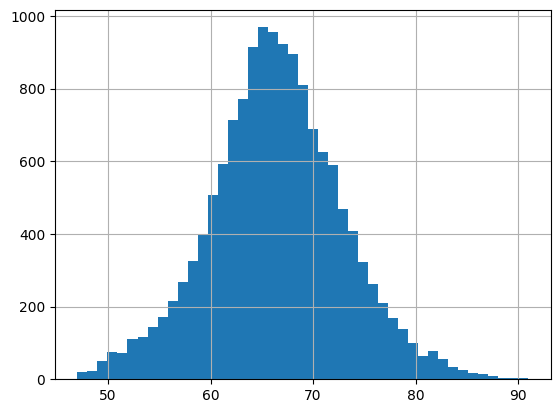

In [20]:
# overall
print(descripcion_columna("OVR"))
print(df['OVR'].describe())
nbins=1*(df.OVR.max()-df.OVR.min())+1
df['OVR'].hist(bins = nbins)
print(nbins)

In [21]:
# Analizamos los mejores jugadores por posición
best_players_per_position=df.iloc[df.groupby(df['Position'])['OVR'].idxmax()][['Position','Name','OVR']]
best_players_per_position

,Position,Name,OVR
3,CAM,Jude Bellingham,90
9,CB,Virgil van Dijk,89
1,CDM,Rodri,91
5,CM,Kevin De Bruyne,90
25,LB,Theo Hernández,87
41,LM,Grimaldo,86
4,LW,Vini Jr.,90
44,RB,Carvajal,86
64,RM,Riyad Mahrez,85
10,RW,Mohamed Salah,89


In [22]:
pd.DataFrame(df.Position.value_counts().sort_index())

,count
Position,
CAM,961
CB,2924
CDM,1330
CM,1890
LB,1214
LM,968
LW,341
RB,1281
RM,896


In [23]:
# Los mejores equipos, con el mejor promedio de overall raking
club_avg_overall=df.groupby("Team")["OVR"].mean().reset_index().sort_values("OVR",ascending=False)
club_avg_overall.head(10)

,Team,OVR
481,Real Madrid,81.173913
365,Lombardia FC,80.260870
204,FC Bayern München,79.708333
373,Manchester City,79.640000
359,Leverkusen,79.428571
62,Atlético de Madrid,78.916667
325,Juventus,78.428571
202,FC Barcelona,78.409091
462,RB Leipzig,78.380952
381,Milano FC,78.375000


In [24]:
# Los equipos con los OVR promedio más altas, pero solo considerando los mejores jugadores (OVR >= 75)
df_best = df[df["OVR"] >= 75]
nation_avg_overall=df_best.groupby("Nation")["OVR"].mean().reset_index().sort_values("OVR",ascending=False)
nation_avg_overall.head(10)

,Nation,OVR
4,Armenia,81.500000
81,Tunisia,81.000000
29,Gabon,80.333333
64,Poland,80.000000
39,Iran,80.000000
48,Libya,80.000000
35,Guinea,80.000000
38,Iceland,80.000000
73,Slovakia,79.800000
24,Egypt,79.750000


In [25]:
# Donde está argentina?
nation_avg_overall[nation_avg_overall["Nation"] == "Argentina"]

,Nation,OVR
3,Argentina,78.023529


In [26]:
df_best[df_best["Nation"] == "Argentina"]

,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,Sprint Speed,Positioning,Finishing,Shot Power,Long Shots,Volleys,Penalties,Vision,Crossing,Free Kick Accuracy,Short Passing,Long Passing,Curve,Dribbling,Agility,Balance,Reactions,Ball Control,Composure,Interceptions,Heading Accuracy,Def Awareness,Standing Tackle,Sliding Tackle,Jumping,Stamina,Strength,Aggression,Position,Weak foot,Skill moves,Preferred foot,Height,Weight,Alternative positions,Age,Nation,League,Team,Type position
8,18,Lautaro Martínez,89,82,88,75,87,54,85,84,80,92,93,87,80,92,74,79,68,65,79,73,80,85,89,92,92,89,88,48,86,55,51,44,93,83,85,87,ST,4,4,Right,"174cm / 5'9""",72kg / 159lb,,27,Argentina,Serie A Enilive,Lombardia FC,Forward
12,25,Lionel Messi,88,79,85,87,92,33,64,86,73,89,85,83,87,86,75,90,80,92,87,86,93,93,90,95,85,93,94,40,60,20,35,24,71,70,68,44,RW,4,4,Left,"169cm / 5'7""",67kg / 148lb,"ST, CAM, RM",37,Argentina,MLS,Inter Miami CF,Forward
24,49,Paulo Dybala,87,80,85,84,89,41,65,84,76,83,84,84,86,92,88,88,83,87,84,79,89,89,88,90,84,91,87,42,65,32,42,39,77,74,67,48,CAM,3,5,Left,"177cm / 5'10""",75kg / 165lb,ST,30,Argentina,Serie A Enilive,AS Roma,Midfielder
43,79,Alexis Mac Allister,86,69,82,85,84,76,76,71,67,80,79,88,82,77,86,86,79,82,87,86,83,84,82,83,85,86,84,78,61,77,79,73,72,87,69,83,CM,3,3,Right,"176cm / 5'9""",72kg / 159lb,CDM,25,Argentina,Premier League,Liverpool,Midfielder
82,149,Julián Álvarez,84,85,84,80,85,57,78,86,85,84,84,88,81,79,78,81,77,80,80,77,87,83,87,87,86,86,84,52,72,60,55,46,83,85,70,86,ST,4,4,Right,"170cm / 5'7""",71kg / 157lb,CAM,24,Argentina,LALIGA EA SPORTS,Atlético de Madrid,Forward
88,149,Rodrigo De Paul,84,76,77,83,82,76,82,77,76,78,76,80,78,71,66,86,78,76,85,85,84,82,78,78,81,85,81,80,58,75,81,75,77,92,78,83,CM,3,4,Right,"180cm / 5'11""",70kg / 154lb,CDM,30,Argentina,LALIGA EA SPORTS,Atlético de Madrid,Midfielder
101,149,Lisandro Martínez,84,71,59,78,79,85,81,74,68,62,52,73,64,56,55,76,75,55,83,83,77,76,77,82,84,81,87,85,75,86,87,84,84,75,79,91,CB,4,3,Left,"178cm / 5'10""",77kg / 170lb,,26,Argentina,Premier League,Man Utd,Defender
105,149,Exequiel Palacios,84,69,76,79,82,82,73,71,68,79,73,81,79,63,72,82,70,54,85,84,73,82,78,79,84,83,83,86,67,80,86,80,73,78,67,84,CM,4,3,Right,"178cm / 5'10""",69kg / 152lb,CDM,25,Argentina,Bundesliga,Leverkusen,Midfielder
107,149,Cristian Romero,84,68,46,59,66,85,81,67,68,43,48,51,36,52,40,50,42,38,75,64,54,60,67,64,85,69,82,86,82,85,86,85,86,71,83,89,CB,2,3,Right,"185cm / 6'1""",79kg / 174lb,,26,Argentina,Premier League,Spurs,Defender
113,222,Marcos Acuña,83,74,74,82,82,80,84,75,74,80,66,83,81,67,76,82,85,75,82,77,88,81,82,90,84,82,86,81,61,81,84,83,79,90,82,83,LB,3,3,Left,"172cm / 5'8""",69kg / 152lb,LM,32,Argentina,Libertadores,River Plate,Defender


In [27]:
# Veamos el primero, armenia
df_best[df_best["Nation"] == "Armenia"]

,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,Sprint Speed,Positioning,Finishing,Shot Power,Long Shots,Volleys,Penalties,Vision,Crossing,Free Kick Accuracy,Short Passing,Long Passing,Curve,Dribbling,Agility,Balance,Reactions,Ball Control,Composure,Interceptions,Heading Accuracy,Def Awareness,Standing Tackle,Sliding Tackle,Jumping,Stamina,Strength,Aggression,Position,Weak foot,Skill moves,Preferred foot,Height,Weight,Alternative positions,Age,Nation,League,Team,Type position
144,222,Henrikh Mkhitaryan,83,78,79,82,84,72,77,80,77,80,78,84,77,79,72,85,79,69,85,82,83,83,85,83,83,86,85,75,68,71,72,70,79,85,72,79,CM,5,4,Right,"177cm / 5'10""",75kg / 165lb,CAM,35,Armenia,Serie A Enilive,Lombardia FC,Midfielder
408,577,Lucas Zelarayán,80,71,77,79,83,46,67,72,71,78,74,79,84,74,67,80,76,88,79,75,82,82,88,84,78,84,70,44,54,50,43,35,67,82,64,56,CAM,3,4,Right,"172cm / 5'8""",70kg / 154lb,ST,32,Armenia,ROSHN Saudi League,Al Fateh,Midfielder


#### El promedio se diluye porque hay muchos jugadores con OVR bajo, dejando en el top ten a países con pocos jugadores pero de muy alta calidad.


# Visualizaciones

Reduciremos el dataset para que la visualizaciones que queden tan cargadas

In [28]:
best_df = df[df["OVR"] >= 75]
print("shape", best_df.shape)


shape (1516, 50)


In [29]:
descripcion_columna("Skill moves")

'The player’s ability to perform advanced dribbling moves (rated from 1 to 5 stars).'

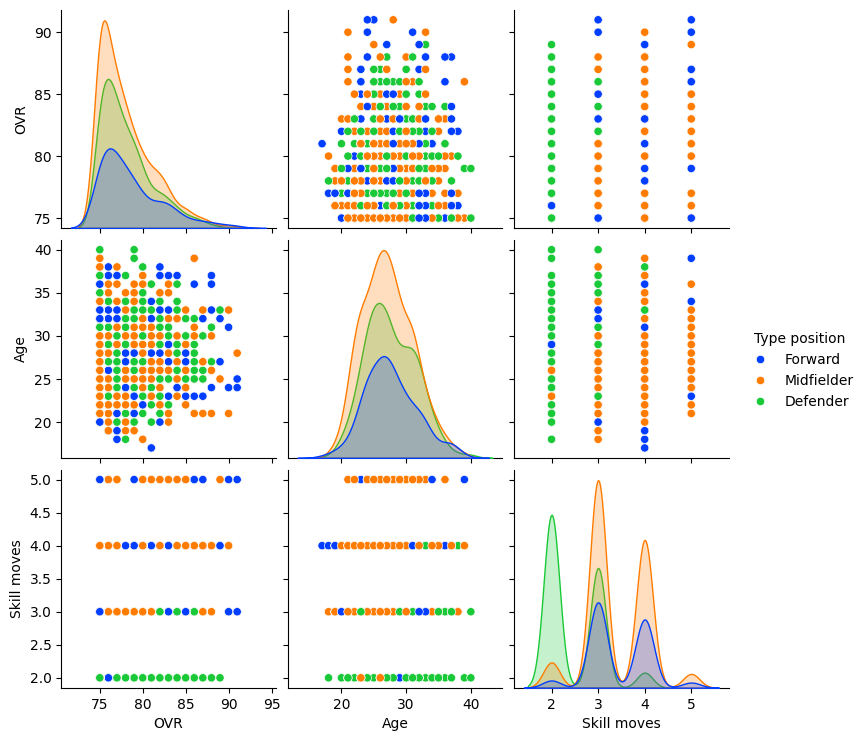

In [30]:
# Comparemos algunos atributos según el tipo de posición (delantero, mediocampista, defensor)
data_temp = best_df.loc[:,["Type position",'OVR','Age','Skill moves']]
sns.pairplot(data_temp, hue="Type position", palette='bright')

Algunos puntos que podemos observar:
- No hay una relación clara entre OVR y la edad, apenas puede visualizarse algunos puntos más alto en ranking en la parte más baja de la edad.
- Skill moves es claramente mejor valuado en posiciones de mediocampo y delanteros
- Si puede verse que la edad de los delanteros de este grupo (overrall > 75) es más baja que la de otras posiciones

Pace: A summary attribute for speed-related skills.


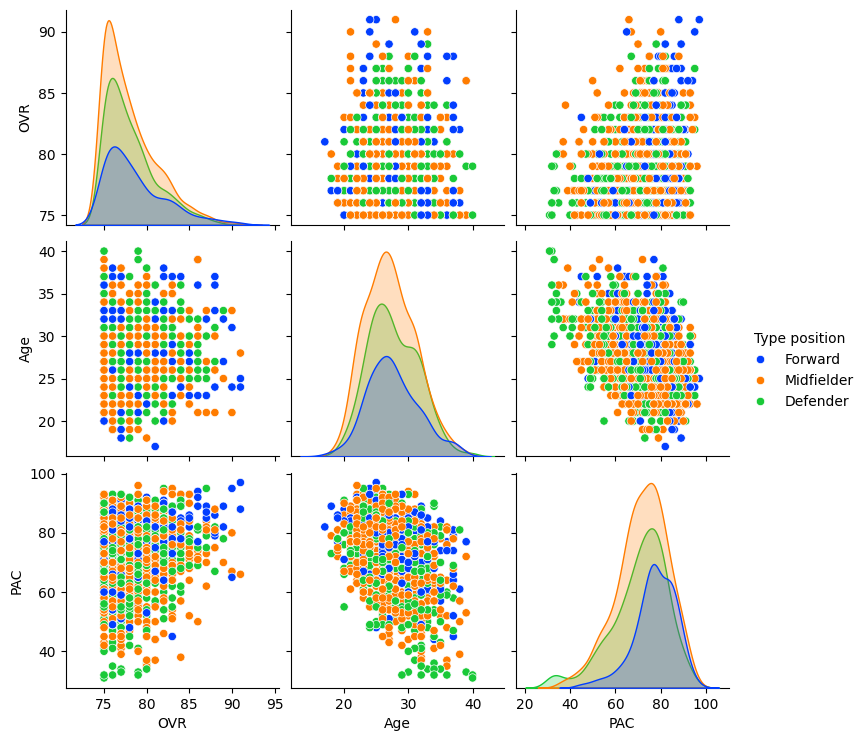

In [31]:
print(descripcion_columna("PAC"))
data_temp = best_df.loc[:,["Type position",'OVR','Age','PAC']]
sns.pairplot(data_temp, hue="Type position", palette='bright')

Observaciones:
- el pace: relacionado con la velocidad, si tiene una relación con la edad, la cual disminuye con el incremento de la edad (inversamente proporcional)
- pasa similar con el overall ranking, seguramente porque estas variables de velocidad infieren en ese promedio.
- en cuanto a posiciones y velocidad, no está claro. Si puede observarse jugadores con edad superior y PAC menor en este dataset reducido (de los mejores rank)

In [32]:
summary_vars = ["OVR", "PAC", "SHO", "PAS", "DRI", "DEF", "PHY"]
for var in summary_vars:
    print(descripcion_columna(var))

Overall rating of the player.
Pace: A summary attribute for speed-related skills.
Shooting: A summary attribute for shooting-related skills.
Passing: A summary attribute for passing-related skills.
Dribbling: A summary attribute for dribbling-related skills.
Defense: A summary attribute for defensive skills.
Physical: A summary attribute for physical skills.


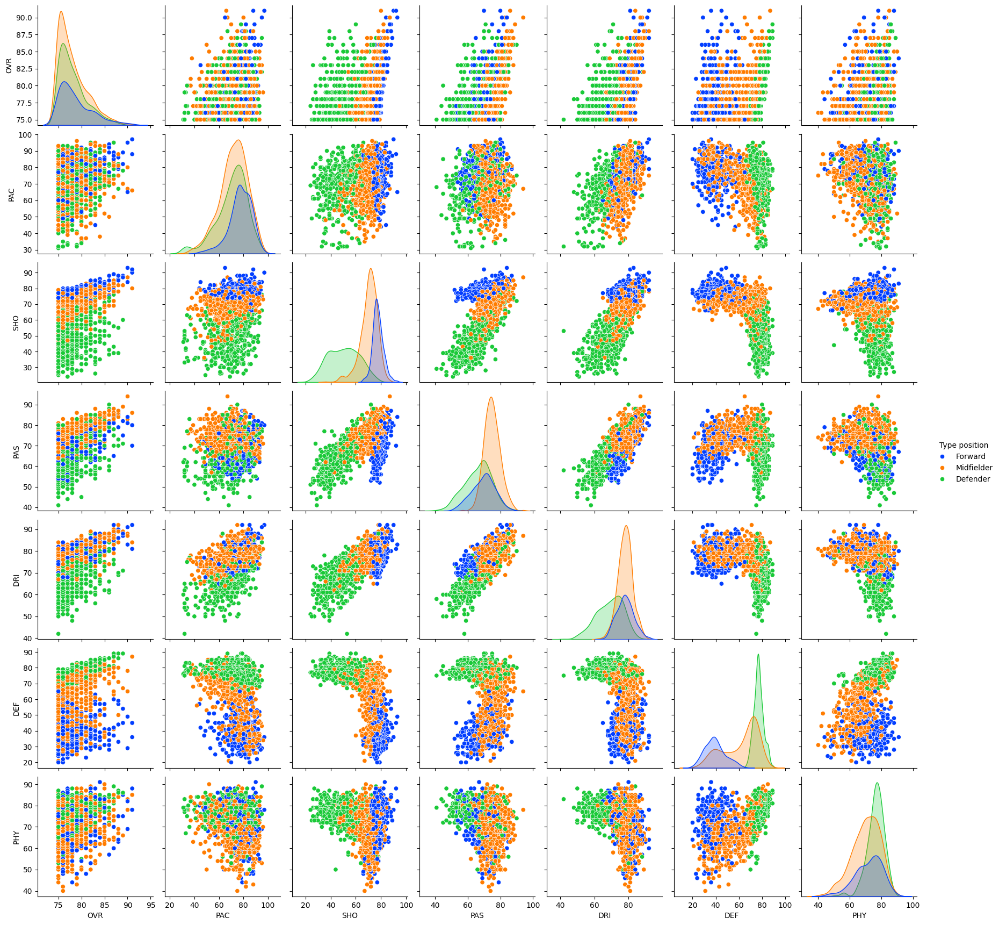

In [33]:
data_temp = best_df.loc[:,["Type position", *summary_vars]]
sns.pairplot(data_temp, hue="Type position", palette='bright')

Se observan, con sentido, cierta relación entre estos agrupadores de skills y la posición que ocupa. Por ejemplo, tiene sentido ver en lo más alto a los delanteros en Shotting, o a las defensores bien arriba en Defensive. Los relativos a la velocidad (PAC) y a lo físico (PHY) no tienen agrupamientos por posición tan claros 

In [34]:
df_skills = df_best[["Name", "Team"] + get_skills_columns()]

def scatter_matrix(skill_1, skill_2):
    graf1 = go.Scatter(
        x=df_skills[skill_1], 
        y=df_skills[skill_2],
        mode='markers',
        text=df_skills.loc[:,'Name'], #'Height', 'Weight', 'Club', 'Age', 'Name','Position'
        marker=dict(size=5)
    )
    layout = go.Layout(
        title=f"Camparación de 2 skills: {skill_1} VS {skill_2}", font=dict(size=20),
        xaxis=dict(title=skill_1),
        yaxis=dict(title=skill_2),
        autosize=True, 
        width=1366,
        height=969
    )
    fig = go.Figure(data=graf1, layout=layout)
    fig.show()

In [35]:
skill_1 = "Dribbling"
skill_2 = "Sprint Speed"

scatter_matrix(skill_1, skill_2)


In [36]:
skill_1 = "Composure"
skill_2 = "Penalties"

scatter_matrix(skill_1, skill_2)


# 3. Se realizó alguna normalización o escalado de la base? ¿porqué?

Todas las variables numéricas que especifican desempeño por habilidad van entre 0-100.

Luego, tenemos dos columnas, Weak foot	Skill moves, que están en el rango [0-5].

Las variables de peso y altura no son numéricas porque están en ambos sistemas de medición (imperial y métrico). Habría que trabajar sobre esos datos.

Para la aplicación de las siguientes técnicas, es posible que se requiera normalizar y/o escalar alguna o varias de estas columnas.

# 4. Aplicación de clustering

Aplicación de clustering para encontrar grupos de jugadores con habilidades equivalentes, por ejemplo, jugadores que podrían intercambiarse en el caso de una lesión o cuando un jugador está cansada. Para esto utilice como mínimo dos técnicas de clustering: por ejemplo k-medias, DBSCAN, mezcla de Gaussianas y/o alguna jerárquica. Justifiquen por qué eligen los diferentes hiper-parámetros que se puedan elegir según el método: número de clusters, medida de distancia, criterio de aglomeración… 

In [37]:
df.head()
print("shape", df.shape)

shape (14345, 50)


### K-medias

In [38]:
from sklearn.cluster import KMeans,MeanShift
from sklearn import decomposition

random_state = 42
df_skills = df[get_skills_columns()]
df_skills


,Acceleration,Sprint Speed,Positioning,Finishing,Shot Power,Long Shots,Volleys,Penalties,Vision,Crossing,Free Kick Accuracy,Short Passing,Long Passing,Curve,Dribbling,Agility,Balance,Reactions,Ball Control,Composure,Interceptions,Heading Accuracy,Def Awareness,Standing Tackle,Sliding Tackle,Jumping,Stamina,Strength,Aggression
0,97,97,93,94,90,83,84,84,83,78,69,86,71,80,93,93,82,93,92,88,38,73,26,34,32,88,88,77,64
1,65,66,76,74,92,89,71,62,84,76,64,93,91,86,84,66,67,93,90,94,84,81,92,87,82,83,91,83,85
2,80,94,96,96,94,83,90,90,74,58,62,77,66,77,79,77,69,94,83,87,43,83,38,47,29,92,76,93,88
3,81,80,91,90,85,86,77,74,90,66,68,89,89,73,89,82,79,91,89,87,82,75,77,79,77,84,93,77,85
4,95,95,87,89,81,83,73,71,85,81,62,83,77,79,93,94,84,86,90,83,26,50,32,25,18,74,84,65,58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14340,32,31,39,44,48,50,25,43,55,38,44,45,51,46,51,64,68,32,50,53,23,37,33,39,40,27,65,36,47
14341,66,67,47,34,50,33,32,40,43,35,39,54,56,30,41,59,71,46,42,36,37,47,36,41,47,49,56,53,59
14342,55,59,50,47,44,50,32,51,45,38,29,37,33,36,49,60,66,48,48,46,41,50,43,42,42,53,51,57,24
14343,69,63,45,24,52,39,33,42,41,39,39,52,55,33,45,54,59,46,43,39,42,49,34,42,49,60,65,68,54


In [39]:

n_clust = 3
km = KMeans(n_clusters=n_clust, random_state=random_state)
km.fit(df_skills)

clusters = km.labels_
print('Suma de los cuadrados de las distancias al centro de cada cluster=Inertia= ', km.inertia_)

Suma de los cuadrados de las distancias al centro de cada cluster=Inertia=  39542240.09580506


In [40]:
df_clusters = df.copy()
df_clusters['kmeans_3'] = km.labels_

df_clusters['kmeans_3'].value_counts()

kmeans_3
1    5270
0    4636
2    4439
Name: count, dtype: int64

In [41]:
import plotly.express as px

def scatter_matrix(skill_1, skill_2):
    fig = px.scatter(
        df_clusters,
        x=skill_1,
        y=skill_2,
        color="kmeans_3",
        hover_name="Name",
        title=f"Clusters by KMeans (kmeans_3): {skill_1} vs {skill_2}",
        width=900,
        height=600
    )
    fig.show()

In [42]:
skill_1 = "Composure"
skill_2 = "Penalties"
scatter_matrix(skill_1, skill_2)

In [43]:
skill_1 = "Dribbling"
skill_2 = "Sprint Speed"
scatter_matrix(skill_1, skill_2)

In [44]:
skill_1 = "Interceptions"
skill_2 = "Vision"
scatter_matrix(skill_1, skill_2)

In [45]:
from random import choices

skill_1, skill_2 = choices(get_skills_columns(), k=2)
scatter_matrix(skill_1, skill_2)

In [52]:
from yellowbrick.cluster import SilhouetteVisualizer, KElbowVisualizer
model = KMeans()

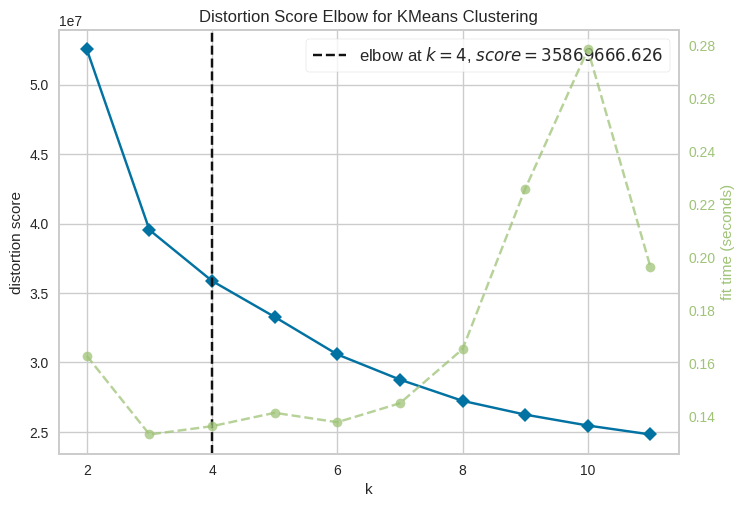

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [53]:
fig = KElbowVisualizer(model, k=(2,12))
fig.fit(df_skills)
fig.show()

Se ve claramente que 3 es un buen número de cluster (la agrupación de position actual)

De vuelta, 3 es el que tiene el mejor score de silueta. Reduzcamos la dimensionalidad con PCA y veamos las siluetas

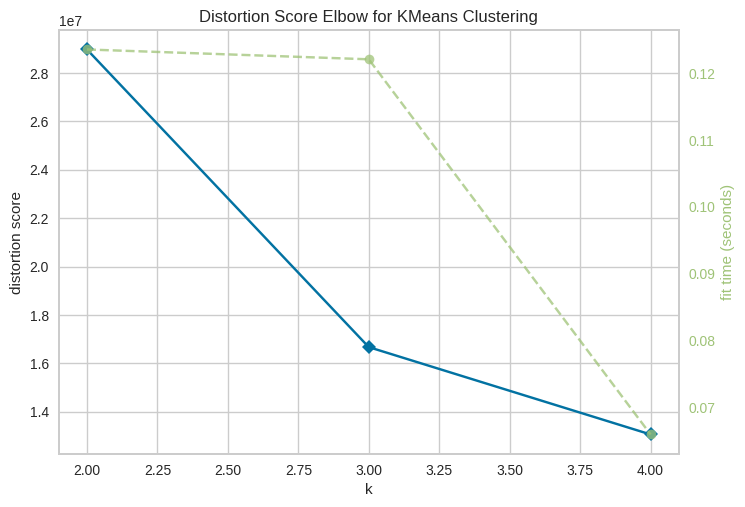

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [54]:
from sklearn.decomposition import PCA

# Si X tiene shape (n_samples, 4)
pca = PCA(n_components=2)
X_2d = pca.fit_transform(df_skills)
df_ = pd.DataFrame(X_2d, columns=['PCA1', 'PCA2'])
model = KMeans()
fig = KElbowVisualizer(model, k=(2,5))
fig.fit(df_)
fig.show()

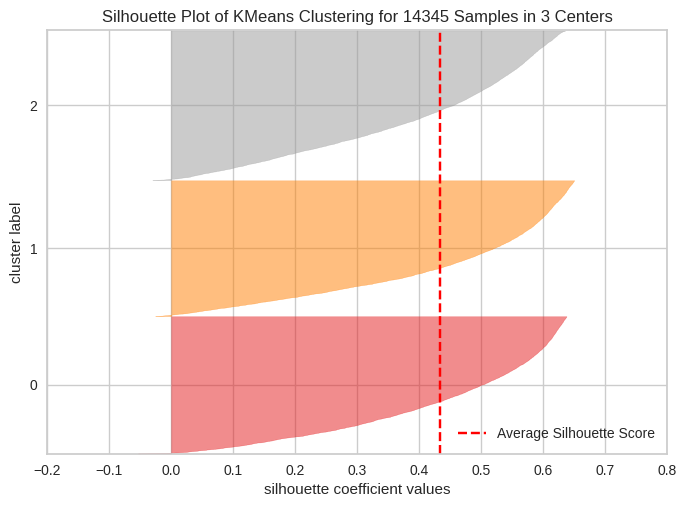

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 14345 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [55]:
from yellowbrick.cluster import SilhouetteVisualizer

model = KMeans(3,random_state=random_state)
visualizer = SilhouetteVisualizer(model)

visualizer.fit(df_)
visualizer.show()

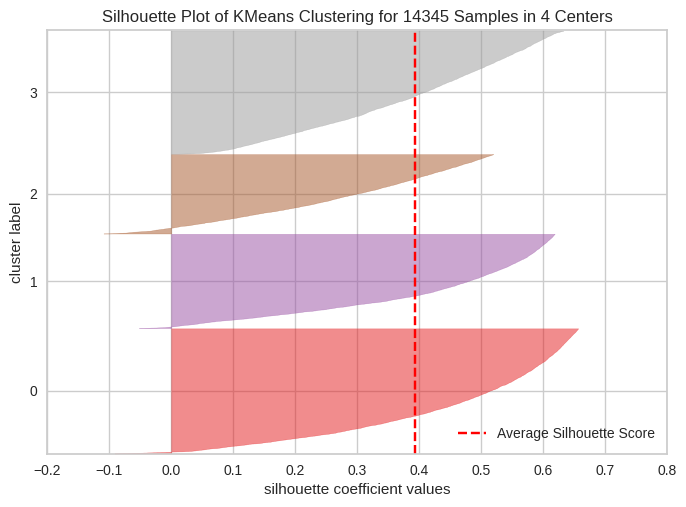

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 14345 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [56]:
model = KMeans(4,random_state=random_state)
visualizer = SilhouetteVisualizer(model)

visualizer.fit(df_)
visualizer.show()

Con 3 cluster, las siluetas son más parejas, sin (casi) valores negativos.

Analicemos mejor PCA

In [ ]:
# tomado del notebook de clase
# Vamos a ver cuanta varianza explica cada componente principal
dim_reduce = PCA()
dim_reduce_fit = dim_reduce.fit_transform(df_skills)

explained_variance = dim_reduce.explained_variance_ratio_
cum_var_exp = np.cumsum(explained_variance) 

# Iterate through the zipped list and print each pair
for num_components, cumulative_variance, explained_variance in zip(range(37), cum_var_exp,explained_variance):
    print(f"{num_components+1}\t{cumulative_variance:.4f}\t{explained_variance:.4f}")

1	0.4034	0.4034
2	0.6801	0.2766
3	0.7762	0.0962
4	0.8265	0.0502
5	0.8462	0.0198
6	0.8638	0.0176
7	0.8783	0.0145
8	0.8917	0.0134
9	0.9040	0.0123
10	0.9155	0.0115
11	0.9242	0.0087
12	0.9321	0.0079
13	0.9395	0.0074
14	0.9464	0.0069
15	0.9527	0.0063
16	0.9582	0.0056
17	0.9634	0.0052
18	0.9684	0.0050
19	0.9731	0.0047
20	0.9773	0.0042
21	0.9811	0.0038
22	0.9848	0.0037
23	0.9882	0.0034
24	0.9914	0.0032
25	0.9945	0.0030
26	0.9965	0.0020
27	0.9981	0.0016
28	0.9993	0.0012
29	1.0000	0.0007


De 29 variables, con 16 tengo el 96% de la variabilidad.

In [57]:
def dim_reduction(x):
    dim_reduce = PCA(n_components=16)
    dim_reduce_fit = dim_reduce.fit_transform(x)
    return dim_reduce, dim_reduce_fit

dim_reduce, dim_reduce_fit = dim_reduction(df_skills)

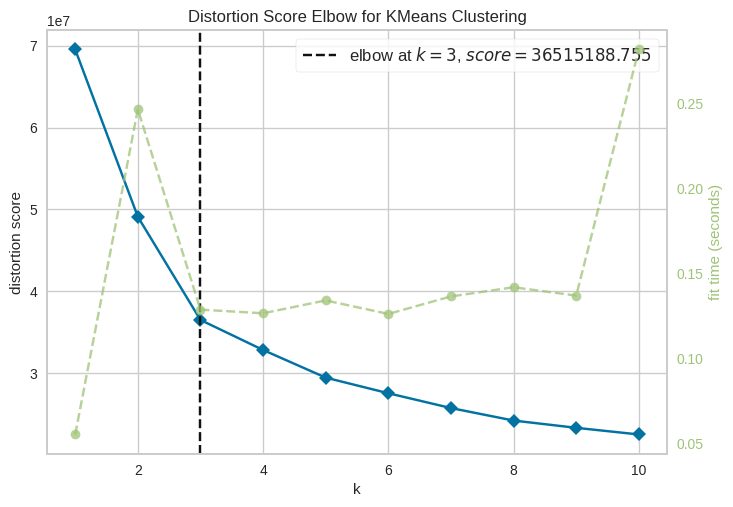

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [58]:

model = KMeans()
fig = KElbowVisualizer(model, k=(1,11))
fig.fit(dim_reduce_fit)
fig.show()

Seguimos viendo k=3. Veamos siluetas

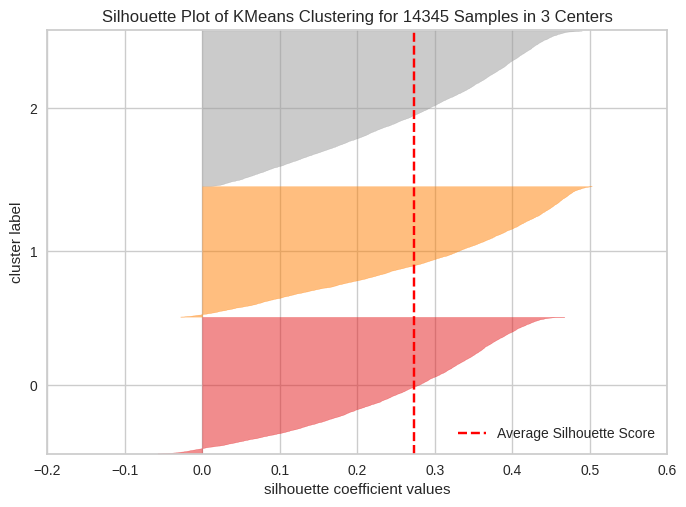

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 14345 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [59]:
model = KMeans(3,random_state=42)
visualizer = SilhouetteVisualizer(model)

visualizer.fit(dim_reduce_fit)
visualizer.show()

gmm_3
0    5779
2    4318
1    4248
Name: count, dtype: int64


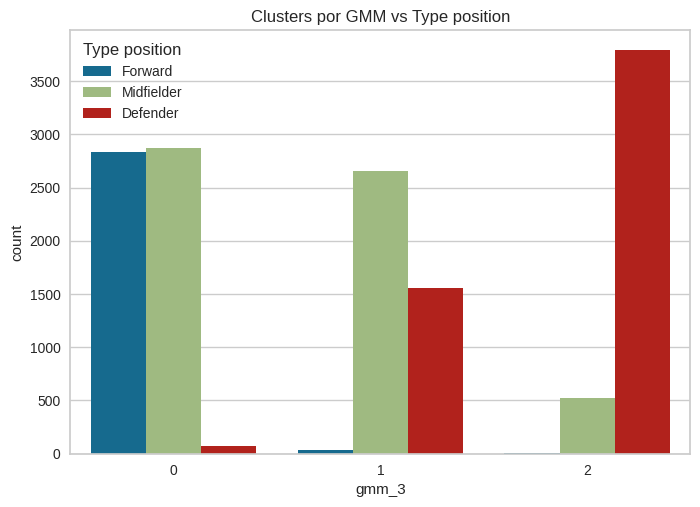

In [64]:
from sklearn.mixture import GaussianMixture

# Entrenamos el modelo GMM con 3 clusters (puedes cambiar n_components)
gmm = GaussianMixture(n_components=3, random_state=42)
gmm_labels = gmm.fit_predict(df_skills)

# Añadimos los clusters al dataframe
df_clusters['gmm_3'] = gmm_labels

# Visualizamos la cantidad de elementos por cluster
print(df_clusters['gmm_3'].value_counts())

# Visualización rápida
sns.countplot(df_clusters, x="gmm_3", hue="Type position")
plt.title("Clusters por GMM vs Type position")
plt.show()

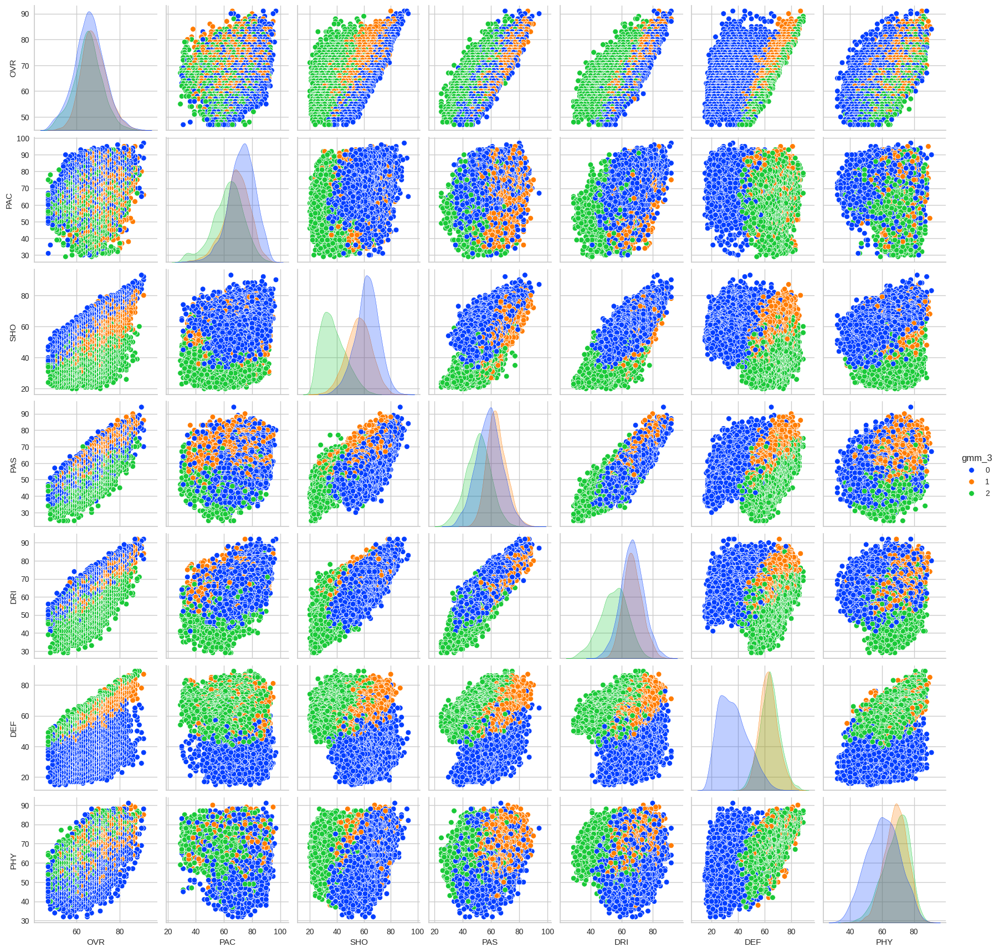

In [73]:
data_temp = df_clusters.loc[:, summary_vars + ["gmm_3"]]
sns.pairplot(data_temp, hue="gmm_3", palette='bright')

Probemos con el dataset reducido por PCA(n_components=16)

gmm_3_pca
2    5430
0    5067
1    3848
Name: count, dtype: int64


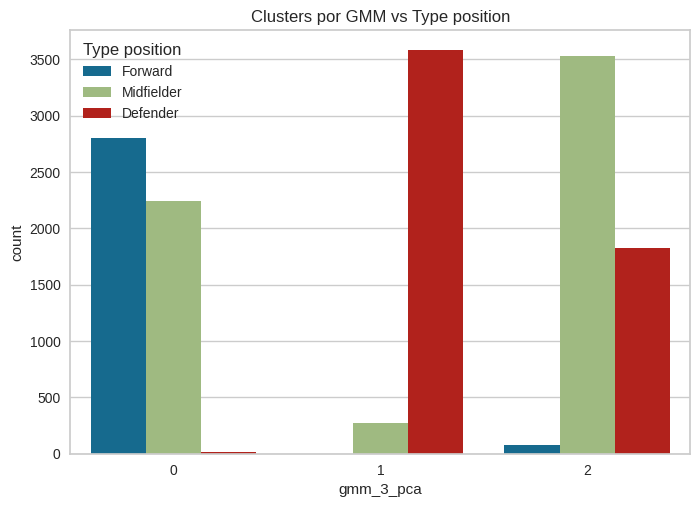

In [75]:
gmm = GaussianMixture(n_components=3, random_state=random_state)
gmm_labels = gmm.fit_predict(dim_reduce_fit)

# Añadimos los clusters al dataframe
df_clusters['gmm_3_pca'] = gmm_labels

# Visualizamos la cantidad de elementos por cluster
print(df_clusters['gmm_3_pca'].value_counts())

# Visualización rápida
sns.countplot(df_clusters, x="gmm_3_pca", hue="Type position")
plt.title("Clusters por GMM vs Type position")
plt.show()

Otro orden y configuración, con mezcla de posiciones, pero cada cluster es dominado por una posición.

# 5. Análisis cualitativo de los clusters

Análisis cualitativo de los clusters encontrados. ¿Qué hay en cada cluster? ¿Son efectivamente equivalentes los jugadores de un cluster, es decir, podrían cumplir el mismo rol en un equipo? Si se trata de clusters heterogéneos, ¿por qué razón pueden haber sido agrupadas los jugadores del cluster? ¿Qué motiva las diferencias en tamaño?

### Analicemos Type Position VS Kmeans_3 para ver como quedaron

In [ ]:
df_clusters["Type position"].value_counts()

Type position
Midfielder    6045
Defender      5419
Forward       2881
Name: count, dtype: int64

In [ ]:
df_clusters["kmeans_3"].value_counts()

kmeans_3
1    5270
0    4636
2    4439
Name: count, dtype: int64

<Axes: xlabel='kmeans_3', ylabel='count'>

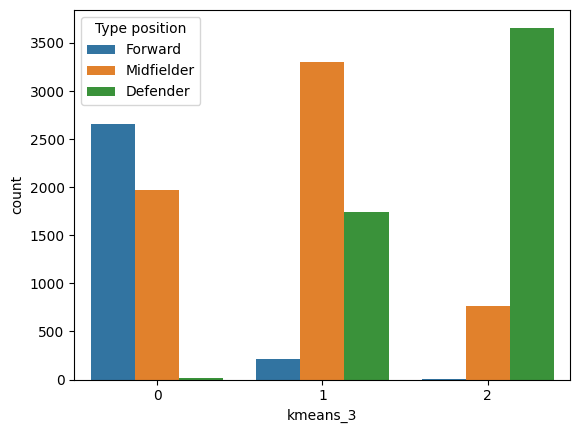

In [ ]:
sns.countplot(df_clusters,x="kmeans_3",hue="Type position")

In [ ]:
pd.crosstab(index=df_clusters['kmeans_3'], columns=df_clusters['Type position'])

Type position,Defender,Forward,Midfielder
kmeans_3,,,
0,12,2655,1969
1,1747,217,3306
2,3660,9,770


### Como deciamos antes, un posición domina cada cluster. 

Por ejemplo
- el cluster 0, es dominado por Delanteros aunque hay muchos mediocampistas que tiene caracteristicas similares, pero muy pocos Defensores.
- el cluster 1, es dominado por mediocampistas, con una buena proporcion de defensores que tienen caracteristicas similares (pero pocos delanteros)
- el cluster 2, es el de los defensores, con un numero interesante de mediocampistas que tienen caracteristicas defensivas. Casi no hay delanteros en este cluster

In [76]:
cluster_0 = df_clusters[df_clusters['kmeans_3'] == 0]
cluster_1 = df_clusters[df_clusters['kmeans_3'] == 1]
cluster_2 = df_clusters[df_clusters['kmeans_3'] == 2]

In [79]:
# cluster 0, es el de los delanteros
cluster_0.head(10)

,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,Sprint Speed,Positioning,Finishing,Shot Power,Long Shots,Volleys,Penalties,Vision,Crossing,Free Kick Accuracy,Short Passing,Long Passing,Curve,Dribbling,Agility,Balance,Reactions,Ball Control,Composure,Interceptions,Heading Accuracy,Def Awareness,Standing Tackle,Sliding Tackle,Jumping,Stamina,Strength,Aggression,Position,Weak foot,Skill moves,Preferred foot,Height,Weight,Alternative positions,Age,Nation,League,Team,Type position,kmeans_3,gmm_3,gmm_2,gmm_3_pca
0,1,Kylian Mbappé,91,97,90,80,92,36,78,97,97,93,94,90,83,84,84,83,78,69,86,71,80,93,93,82,93,92,88,38,73,26,34,32,88,88,77,64,ST,4,5,Right,"182cm / 6'0""",75kg / 165lb,LW,25,France,LALIGA EA SPORTS,Real Madrid,Forward,0,0,0,0
4,7,Vini Jr.,90,95,84,81,91,29,69,95,95,87,89,81,83,73,71,85,81,62,83,77,79,93,94,84,86,90,83,26,50,32,25,18,74,84,65,58,LW,4,5,Right,"176cm / 5'9""",73kg / 161lb,"ST, LM",24,Brazil,LALIGA EA SPORTS,Real Madrid,Forward,0,0,0,0
12,25,Lionel Messi,88,79,85,87,92,33,64,86,73,89,85,83,87,86,75,90,80,92,87,86,93,93,90,95,85,93,94,40,60,20,35,24,71,70,68,44,RW,4,4,Left,"169cm / 5'7""",67kg / 148lb,"ST, CAM, RM",37,Argentina,MLS,Inter Miami CF,Forward,0,0,0,0
21,45,Victor Osimhen,87,89,84,65,81,42,82,85,92,92,88,86,74,83,75,70,62,52,72,54,63,80,78,67,89,84,80,34,86,36,45,22,94,81,86,68,ST,4,3,Right,"186cm / 6'1""",77kg / 170lb,,25,Nigeria,Serie A Enilive,SSC Napoli,Forward,0,0,0,0
26,52,Neymar Jr,87,85,79,84,92,37,60,86,84,81,80,77,75,84,85,85,81,87,85,80,86,94,90,83,78,93,92,37,63,35,32,29,72,73,52,63,LW,5,5,Right,"175cm / 5'9""",68kg / 150lb,"CAM, LM",32,Brazil,ROSHN Saudi League,Al Hilal,Forward,0,0,0,0
35,68,Cristiano Ronaldo,86,77,88,77,80,34,77,73,80,90,87,92,85,83,90,78,78,76,79,70,79,77,76,61,87,86,92,29,87,24,32,24,94,80,79,62,ST,4,5,Right,"187cm / 6'2""",85kg / 187lb,,39,Portugal,ROSHN Saudi League,Al Nassr,Forward,0,0,0,0
38,72,Rodrygo,86,89,81,79,88,31,64,90,88,84,86,76,77,67,82,83,79,73,80,73,80,89,87,84,84,87,85,21,67,24,34,30,77,81,59,54,RW,4,4,Right,"174cm / 5'9""",64kg / 141lb,"ST, RM",23,Brazil,LALIGA EA SPORTS,Real Madrid,Forward,0,0,0,0
40,74,Rafael Leão,86,94,79,80,87,28,77,94,94,76,83,80,75,74,63,84,84,60,83,70,79,88,85,84,84,87,83,24,72,22,24,21,90,75,83,60,LW,4,5,Right,"188cm / 6'2""",81kg / 179lb,"LM, ST",25,Portugal,Serie A Enilive,Milano FC,Forward,0,0,0,0
45,83,Ousmane Dembélé,86,92,75,82,88,41,57,94,91,80,72,83,74,76,75,85,86,64,83,78,84,89,94,81,82,87,82,38,43,42,42,34,65,69,52,54,RW,5,5,Left,"178cm / 5'10""",67kg / 148lb,"CAM, RM",27,France,Ligue 1 McDonald's,Paris SG,Forward,0,0,0,0
49,90,Karim Benzema,86,77,85,81,84,38,77,76,77,88,87,87,81,87,68,86,75,73,86,76,82,84,77,72,84,87,84,39,87,43,24,18,84,80,81,63,ST,4,4,Right,"185cm / 6'1""",81kg / 179lb,,36,France,ROSHN Saudi League,Al Ittihad,Forward,0,0,0,0


Efectivamente, los primeros son todos delanteros. Veamos si analizando los vecinos cercanos, ellos serían buenos reemplazos

In [84]:
from sklearn.neighbors import NearestNeighbors

cluster_0_skill = cluster_0[get_skills_columns()]
nbrs = NearestNeighbors(n_neighbors=5, algorithm='auto').fit(cluster_0_skill)


In [89]:
print("Buscando vecinos cercanos para:", cluster_0.iloc[0]["Name"])
distances, indices = nbrs.kneighbors([cluster_0_skill.iloc[0]])

print("Índices de los vecinos más cercanos:", indices[0])
print("Distancias:", distances[0])
cluster_0.iloc[indices[0]]

Buscando vecinos cercanos para: Kylian Mbappé
Índices de los vecinos más cercanos: [ 0 26 10 13 17]
Distancias: [ 0.         37.96050579 39.38273734 42.29657197 43.89760814]


,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,Sprint Speed,Positioning,Finishing,Shot Power,Long Shots,Volleys,Penalties,Vision,Crossing,Free Kick Accuracy,Short Passing,Long Passing,Curve,Dribbling,Agility,Balance,Reactions,Ball Control,Composure,Interceptions,Heading Accuracy,Def Awareness,Standing Tackle,Sliding Tackle,Jumping,Stamina,Strength,Aggression,Position,Weak foot,Skill moves,Preferred foot,Height,Weight,Alternative positions,Age,Nation,League,Team,Type position,kmeans_3,gmm_3,gmm_2,gmm_3_pca
0,1,Kylian Mbappé,91,97,90,80,92,36,78,97,97,93,94,90,83,84,84,83,78,69,86,71,80,93,93,82,93,92,88,38,73,26,34,32,88,88,77,64,ST,4,5,Right,"182cm / 6'0""",75kg / 165lb,LW,25,France,LALIGA EA SPORTS,Real Madrid,Forward,0,0,0,0
142,222,Donyell Malen,83,89,81,74,85,35,72,93,86,84,84,86,72,81,74,75,74,61,79,64,76,86,87,86,82,85,79,31,67,29,33,35,84,77,72,65,RM,4,4,Right,"176cm / 5'9""",68kg / 150lb,"ST, LM, RW",25,Holland,Bundesliga,Borussia Dortmund,Midfielder,0,0,0,0
58,101,Alexander Isak,85,85,84,73,86,39,74,83,87,86,87,82,78,79,83,80,68,65,78,60,75,88,80,69,85,87,86,38,78,35,34,29,88,78,77,58,ST,5,4,Right,"192cm / 6'4""",77kg / 170lb,,24,Sweden,Premier League,Newcastle Utd,Forward,0,0,0,0
71,101,Leroy Sané,85,90,83,80,86,37,70,89,91,82,83,87,81,84,65,81,81,80,82,72,83,87,87,82,83,85,83,34,64,36,32,35,72,78,67,65,RM,2,4,Left,"183cm / 6'0""",80kg / 176lb,"LM, RW",28,Germany,Bundesliga,FC Bayern München,Midfielder,0,0,0,0
90,149,Luis Díaz,84,90,80,75,87,39,75,91,90,83,80,84,81,81,63,77,76,58,76,71,77,89,88,77,83,87,82,28,64,35,42,34,80,87,69,74,LW,4,4,Right,"180cm / 5'11""",73kg / 161lb,"RW, LM",27,Colombia,Premier League,Liverpool,Forward,0,0,0,0


In [93]:
print("Buscando vecinos cercanos para:", cluster_0.iloc[2]["Name"])
distances, indices = nbrs.kneighbors([cluster_0_skill.iloc[2]])

print("Índices de los vecinos más cercanos:", indices[0])
print("Distancias:", distances[0])
cluster_0.iloc[indices[0]]

Buscando vecinos cercanos para: Lionel Messi
Índices de los vecinos más cercanos: [ 2 11  4 29 13]
Distancias: [ 0.         40.95119046 41.66533331 47.32863826 49.36598019]


,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,Sprint Speed,Positioning,Finishing,Shot Power,Long Shots,Volleys,Penalties,Vision,Crossing,Free Kick Accuracy,Short Passing,Long Passing,Curve,Dribbling,Agility,Balance,Reactions,Ball Control,Composure,Interceptions,Heading Accuracy,Def Awareness,Standing Tackle,Sliding Tackle,Jumping,Stamina,Strength,Aggression,Position,Weak foot,Skill moves,Preferred foot,Height,Weight,Alternative positions,Age,Nation,League,Team,Type position,kmeans_3,gmm_3,gmm_2,gmm_3_pca
12,25,Lionel Messi,88,79,85,87,92,33,64,86,73,89,85,83,87,86,75,90,80,92,87,86,93,93,90,95,85,93,94,40,60,20,35,24,71,70,68,44,RW,4,4,Left,"169cm / 5'7""",67kg / 148lb,"ST, CAM, RM",37,Argentina,MLS,Inter Miami CF,Forward,0,0,0,0
64,101,Riyad Mahrez,85,79,81,81,88,39,62,83,76,83,81,82,82,76,73,83,81,80,83,75,85,88,91,90,82,90,81,39,56,45,34,22,71,79,58,48,RM,4,5,Left,"179cm / 5'10""",67kg / 148lb,RW,33,Algeria,ROSHN Saudi League,Al Ahli,Midfielder,0,0,0,0
26,52,Neymar Jr,87,85,79,84,92,37,60,86,84,81,80,77,75,84,85,85,81,87,85,80,86,94,90,83,78,93,92,37,63,35,32,29,72,73,52,63,LW,5,5,Right,"175cm / 5'9""",68kg / 150lb,"CAM, LM",32,Brazil,ROSHN Saudi League,Al Hilal,Forward,0,0,0,0
166,222,Leandro Trossard,83,82,81,80,85,30,61,87,77,83,83,81,79,78,75,81,79,69,82,77,83,84,92,85,80,84,84,18,65,30,31,18,75,76,57,47,LW,5,4,Right,"171cm / 5'7""",67kg / 148lb,"ST, LM",29,Belgium,Premier League,Arsenal,Forward,0,0,0,0
71,101,Leroy Sané,85,90,83,80,86,37,70,89,91,82,83,87,81,84,65,81,81,80,82,72,83,87,87,82,83,85,83,34,64,36,32,35,72,78,67,65,RM,2,4,Left,"183cm / 6'0""",80kg / 176lb,"LM, RW",28,Germany,Bundesliga,FC Bayern München,Midfielder,0,0,0,0


In [94]:
# cluster 1, es el de los mediocampistas
cluster_1.head(10)


,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,Sprint Speed,Positioning,Finishing,Shot Power,Long Shots,Volleys,Penalties,Vision,Crossing,Free Kick Accuracy,Short Passing,Long Passing,Curve,Dribbling,Agility,Balance,Reactions,Ball Control,Composure,Interceptions,Heading Accuracy,Def Awareness,Standing Tackle,Sliding Tackle,Jumping,Stamina,Strength,Aggression,Position,Weak foot,Skill moves,Preferred foot,Height,Weight,Alternative positions,Age,Nation,League,Team,Type position,kmeans_3,gmm_3,gmm_2,gmm_3_pca
1,2,Rodri,91,66,80,86,84,87,85,65,66,76,74,92,89,71,62,84,76,64,93,91,86,84,66,67,93,90,94,84,81,92,87,82,83,91,83,85,CDM,4,3,Right,"191cm / 6'3""",82kg / 181lb,CM,28,Spain,Premier League,Manchester City,Midfielder,1,1,1,2
2,4,Erling Haaland,91,88,92,70,81,45,88,80,94,96,96,94,83,90,90,74,58,62,77,66,77,79,77,69,94,83,87,43,83,38,47,29,92,76,93,88,ST,3,3,Left,"195cm / 6'5""",94kg / 207lb,,24,Norway,Premier League,Manchester City,Forward,1,0,0,0
3,5,Jude Bellingham,90,80,87,83,88,78,83,81,80,91,90,85,86,77,74,90,66,68,89,89,73,89,82,79,91,89,87,82,75,77,79,77,84,93,77,85,CAM,4,4,Right,"186cm / 6'1""",75kg / 165lb,CM,21,England,LALIGA EA SPORTS,Real Madrid,Midfielder,1,1,1,2
5,9,Kevin De Bruyne,90,67,87,94,87,65,78,67,67,88,84,92,90,83,83,95,95,83,94,93,93,86,75,78,92,92,88,66,55,66,70,53,71,88,75,75,CM,5,4,Right,"181cm / 5'11""",75kg / 165lb,CAM,33,Belgium,Premier League,Manchester City,Midfielder,1,0,0,0
6,11,Harry Kane,90,65,93,84,83,49,82,64,66,94,95,94,89,89,93,86,80,69,86,88,82,82,66,73,94,87,92,42,91,46,46,38,87,75,86,80,ST,4,3,Right,"188cm / 6'2""",86kg / 190lb,,31,England,Bundesliga,FC Bayern München,Forward,1,0,0,0
7,12,Martin Ødegaard,89,70,82,89,89,67,66,72,69,84,83,82,84,79,68,91,86,85,91,89,84,89,85,83,91,91,87,69,55,68,72,57,66,88,56,64,CM,2,5,Left,"178cm / 5'10""",68kg / 150lb,CAM,25,Norway,Premier League,Arsenal,Midfielder,1,0,0,2
8,18,Lautaro Martínez,89,82,88,75,87,54,85,84,80,92,93,87,80,92,74,79,68,65,79,73,80,85,89,92,92,89,88,48,86,55,51,44,93,83,85,87,ST,4,4,Right,"174cm / 5'9""",72kg / 159lb,,27,Argentina,Serie A Enilive,Lombardia FC,Forward,1,0,0,0
9,20,Virgil van Dijk,89,78,60,71,71,89,86,66,87,47,52,81,64,45,62,67,53,70,80,86,60,70,54,50,88,77,90,88,87,90,91,86,89,72,93,85,CB,3,2,Right,"193cm / 6'4""",92kg / 203lb,,33,Holland,Premier League,Liverpool,Defender,1,2,1,1
10,22,Mohamed Salah,89,89,87,82,88,45,75,89,89,92,90,82,84,83,81,85,80,69,86,77,84,88,89,91,93,86,88,55,59,38,43,41,79,87,73,63,RW,3,4,Left,"175cm / 5'9""",72kg / 159lb,RM,32,Egypt,Premier League,Liverpool,Forward,1,0,0,0
11,23,Phil Foden,88,86,86,85,90,57,63,89,83,85,88,89,89,59,64,86,80,74,88,84,88,90,92,92,85,91,86,59,47,60,59,47,66,83,53,64,RW,3,4,Left,"171cm / 5'7""",69kg / 152lb,"LW, CAM, RM",24,England,Premier League,Manchester City,Forward,1,0,0,0


Este cluster tiene al principio una mezcla entre delanteros y mediocampistas.

In [95]:
cluster_1_skill = cluster_1[get_skills_columns()]
nbrs = NearestNeighbors(n_neighbors=5, algorithm='auto').fit(cluster_1_skill)
print("Buscando vecinos cercanos para:", cluster_1.iloc[5]["Name"])
distances, indices = nbrs.kneighbors([cluster_1_skill.iloc[5]])

print("Índices de los vecinos más cercanos:", indices[0])
print("Distancias:", distances[0])
cluster_1.iloc[indices[0]]

Buscando vecinos cercanos para: Martin Ødegaard
Índices de los vecinos más cercanos: [  5 115  14  33   3]
Distancias: [ 0.         30.2654919  34.40930107 34.42382896 36.15245497]


,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,Sprint Speed,Positioning,Finishing,Shot Power,Long Shots,Volleys,Penalties,Vision,Crossing,Free Kick Accuracy,Short Passing,Long Passing,Curve,Dribbling,Agility,Balance,Reactions,Ball Control,Composure,Interceptions,Heading Accuracy,Def Awareness,Standing Tackle,Sliding Tackle,Jumping,Stamina,Strength,Aggression,Position,Weak foot,Skill moves,Preferred foot,Height,Weight,Alternative positions,Age,Nation,League,Team,Type position,kmeans_3,gmm_3,gmm_2,gmm_3_pca
7,12,Martin Ødegaard,89,70,82,89,89,67,66,72,69,84,83,82,84,79,68,91,86,85,91,89,84,89,85,83,91,91,87,69,55,68,72,57,66,88,56,64,CM,2,5,Left,"178cm / 5'10""",68kg / 150lb,CAM,25,Norway,Premier League,Arsenal,Midfielder,1,0,0,2
151,222,Pedro Gonçalves,83,78,82,84,84,63,68,80,76,85,84,78,83,79,82,85,83,81,85,80,82,84,85,87,84,84,85,71,59,63,65,48,72,84,62,64,LW,4,4,Right,"173cm / 5'8""",77kg / 170lb,"CAM, CM, LM",26,Portugal,Liga Portugal,Sporting CP,Forward,1,0,0,2
17,34,Bernardo Silva,88,75,78,86,92,71,69,83,69,85,78,79,79,78,64,87,84,67,91,82,84,93,95,92,89,92,89,73,54,70,76,68,68,93,54,78,CM,3,4,Left,"173cm / 5'8""",64kg / 141lb,RW,30,Portugal,Premier League,Manchester City,Midfielder,1,1,0,2
42,77,Luka Modrić,86,72,76,88,87,71,64,75,69,76,72,79,82,76,83,90,86,78,90,90,85,84,92,92,85,90,91,79,55,70,73,72,67,76,58,62,CM,4,4,Right,"172cm / 5'8""",66kg / 146lb,"CAM, CDM",39,Croatia,LALIGA EA SPORTS,Real Madrid,Midfielder,1,1,0,2
5,9,Kevin De Bruyne,90,67,87,94,87,65,78,67,67,88,84,92,90,83,83,95,95,83,94,93,93,86,75,78,92,92,88,66,55,66,70,53,71,88,75,75,CM,5,4,Right,"181cm / 5'11""",75kg / 165lb,CAM,33,Belgium,Premier League,Manchester City,Midfielder,1,0,0,0


In [96]:
# cluster 2, es el de los mediocampistas
cluster_2.head(10)

,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,Sprint Speed,Positioning,Finishing,Shot Power,Long Shots,Volleys,Penalties,Vision,Crossing,Free Kick Accuracy,Short Passing,Long Passing,Curve,Dribbling,Agility,Balance,Reactions,Ball Control,Composure,Interceptions,Heading Accuracy,Def Awareness,Standing Tackle,Sliding Tackle,Jumping,Stamina,Strength,Aggression,Position,Weak foot,Skill moves,Preferred foot,Height,Weight,Alternative positions,Age,Nation,League,Team,Type position,kmeans_3,gmm_3,gmm_2,gmm_3_pca
36,69,Gabriel,86,69,41,63,61,86,82,61,76,44,37,62,30,28,40,59,38,27,80,76,47,54,51,37,85,71,74,86,87,87,86,86,86,71,86,87,CB,2,2,Left,"190cm / 6'3""",87kg / 192lb,,26,Brazil,Premier League,Arsenal,Defender,2,2,1,1
48,89,Jonathan Tah,86,71,38,60,62,86,84,53,86,36,32,60,26,53,38,56,39,27,78,68,37,60,49,40,84,67,79,83,87,87,87,81,86,69,92,83,CB,3,2,Right,"195cm / 6'5""",94kg / 207lb,,28,Germany,Bundesliga,Leverkusen,Defender,2,2,1,1
119,222,Andreas Christensen,83,67,32,68,71,85,76,56,76,32,36,37,20,25,36,62,51,39,83,79,41,67,61,61,84,79,79,86,80,86,86,84,80,73,78,75,CB,3,2,Right,"187cm / 6'2""",82kg / 181lb,CDM,28,Denmark,LALIGA EA SPORTS,FC Barcelona,Defender,2,2,1,1
126,222,José María Giménez,83,71,46,58,61,85,82,70,71,25,37,73,48,34,40,46,47,44,71,68,37,55,56,57,78,66,75,84,82,87,85,85,88,71,85,87,CB,3,2,Right,"185cm / 6'1""",79kg / 174lb,,29,Uruguay,LALIGA EA SPORTS,Atlético de Madrid,Defender,2,2,1,1
133,222,Kim Min Jae,83,76,33,57,63,85,83,74,78,48,23,51,37,24,30,57,35,23,75,64,36,57,65,65,82,68,66,85,81,84,87,85,84,76,86,84,CB,3,2,Right,"190cm / 6'3""",81kg / 179lb,,27,Korea Republic,Bundesliga,FC Bayern München,Defender,2,2,1,1
134,222,Ibrahima Konaté,83,75,34,59,68,83,84,69,80,37,29,45,31,28,41,57,38,27,76,70,32,69,55,34,81,74,78,82,81,82,85,81,83,71,90,83,CB,3,3,Right,"194cm / 6'4""",95kg / 209lb,,25,France,Premier League,Liverpool,Defender,2,2,1,1
139,222,Robin Le Normand,83,62,26,54,60,84,79,58,66,21,19,40,22,38,34,32,35,25,80,67,34,52,41,51,83,74,73,83,85,84,86,82,86,70,86,73,CB,3,2,Right,"187cm / 6'2""",81kg / 179lb,,27,Spain,LALIGA EA SPORTS,Atlético de Madrid,Defender,2,2,1,1
147,222,Willi Orban,83,58,36,56,56,85,78,50,65,42,38,37,29,31,41,44,39,32,74,68,28,52,48,52,82,59,72,83,85,86,86,81,90,58,85,83,CB,3,2,Right,"186cm / 6'1""",87kg / 192lb,,31,Hungary,Bundesliga,RB Leipzig,Defender,2,2,1,1
156,222,Alessio Romagnoli,83,64,40,56,69,85,79,65,64,31,30,63,46,28,34,45,36,24,75,69,35,68,52,54,82,75,77,85,81,86,86,86,86,68,83,82,CB,3,2,Left,"185cm / 6'1""",75kg / 165lb,,29,Italy,Serie A Enilive,Latium,Defender,2,2,1,1
163,222,Fikayo Tomori,83,84,40,60,68,85,80,81,87,37,33,56,45,32,27,48,53,40,75,65,38,61,74,71,84,70,81,84,83,84,87,81,92,71,81,88,CB,4,2,Right,"185cm / 6'1""",79kg / 174lb,,26,England,Serie A Enilive,Milano FC,Defender,2,2,1,1


Aquí si los primeros son todos defensores. La intuición nos dice que las características entre delanteros y defensores están más distantes, y por eso puede agruparlas mejor.

In [97]:
cluster_2_skill = cluster_2[get_skills_columns()]
nbrs = NearestNeighbors(n_neighbors=5, algorithm='auto').fit(cluster_2_skill)
print("Buscando vecinos cercanos para:", cluster_2.iloc[8]["Name"])
distances, indices = nbrs.kneighbors([cluster_2_skill.iloc[8]])

print("Índices de los vecinos más cercanos:", indices[0])
print("Distancias:", distances[0])
cluster_2.iloc[indices[0]]

Buscando vecinos cercanos para: Alessio Romagnoli
Índices de los vecinos más cercanos: [ 8  3 22 15 52]
Distancias: [ 0.         34.92849839 36.89173349 37.82856064 38.87158345]


,Rank,Name,OVR,PAC,SHO,PAS,DRI,DEF,PHY,Acceleration,Sprint Speed,Positioning,Finishing,Shot Power,Long Shots,Volleys,Penalties,Vision,Crossing,Free Kick Accuracy,Short Passing,Long Passing,Curve,Dribbling,Agility,Balance,Reactions,Ball Control,Composure,Interceptions,Heading Accuracy,Def Awareness,Standing Tackle,Sliding Tackle,Jumping,Stamina,Strength,Aggression,Position,Weak foot,Skill moves,Preferred foot,Height,Weight,Alternative positions,Age,Nation,League,Team,Type position,kmeans_3,gmm_3,gmm_2,gmm_3_pca
156,222,Alessio Romagnoli,83,64,40,56,69,85,79,65,64,31,30,63,46,28,34,45,36,24,75,69,35,68,52,54,82,75,77,85,81,86,86,86,86,68,83,82,CB,3,2,Left,"185cm / 6'1""",75kg / 165lb,,29,Italy,Serie A Enilive,Latium,Defender,2,2,1,1
126,222,José María Giménez,83,71,46,58,61,85,82,70,71,25,37,73,48,34,40,46,47,44,71,68,37,55,56,57,78,66,75,84,82,87,85,85,88,71,85,87,CB,3,2,Right,"185cm / 6'1""",79kg / 174lb,,29,Uruguay,LALIGA EA SPORTS,Atlético de Madrid,Defender,2,2,1,1
387,577,Davinson Sánchez,80,77,47,55,65,79,82,69,84,34,44,66,44,32,44,48,36,27,72,68,31,62,61,55,78,70,63,78,78,78,80,82,88,68,88,85,CB,2,2,Right,"187cm / 6'2""",81kg / 179lb,,28,Colombia,Trendyol Süper Lig,Galatasaray,Defender,2,2,1,1
293,458,Stefan Savić,81,63,35,57,57,83,79,57,68,29,34,45,31,27,37,55,36,30,72,71,34,47,57,53,80,66,80,83,83,83,84,81,84,69,82,85,CB,3,2,Right,"187cm / 6'2""",80kg / 176lb,,33,Montenegro,Trendyol Süper Lig,Trabzonspor,Defender,2,2,1,1
690,970,Giorgio Scalvini,78,55,35,57,61,80,73,56,55,28,23,57,39,39,35,61,38,22,72,62,35,56,48,42,77,70,72,81,73,79,82,80,75,64,75,81,CB,3,2,Right,"194cm / 6'4""",75kg / 165lb,,20,Italy,Serie A Enilive,Bergamo Calcio,Defender,2,2,1,1


# 6. Uso de alguna transformación (proyección, embedding)

Uso de alguna transformación (proyección, Embedding) para visualizar los resultados y/o usarla como preprocesado para aplicar alguna técnica de clustering.

### Profe, nos faltó esta parte. La completamos y se la enviamos, pero ya sería fuera de término.